# I. IMPORT DATASETS AND LIBRARIES

In [1]:
import pandas as pd
import seaborn as sns
import plotly.express as px
from copy import copy
from scipy import stats
import matplotlib.pyplot as plt
import numpy as np
import plotly.figure_factory as ff

In [2]:
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

**Cách 1: Lấy dữ liệu từ thư viện Vnstock3**

In [3]:
### from vnstock3 import Vnstock
### from vnstock3 import *
###listing_companies()

**Cách 2: Sử dụng dữ liệu từ cafef**

In [4]:
stocks = pd.read_csv('F://HOSE_Upto1810.csv', parse_dates = ['<DTYYYYMMDD>'])

In [5]:
stocks

,<Ticker>,<DTYYYYMMDD>,<Open>,<High>,<Low>,<Close>,<Volume>
0,VNAll-INDEX,2024-10-18,1348.3100,1351.1300,1341.3300,1342.0900,533840700
1,AAA,2024-10-18,9.3100,9.4300,9.3100,9.3200,1094900
2,AAM,2024-10-18,7.1200,7.1400,7.0000,7.1400,12600
3,AAT,2024-10-18,3.4500,3.4500,3.4200,3.4500,33400
4,ABR,2024-10-18,15.0000,15.0000,15.0000,15.0000,17400
...,...,...,...,...,...,...,...
1048280,VSC,2012-11-01,2.4272,2.4272,2.3499,2.3524,44400
1048281,VSH,2012-11-01,5.5230,5.7860,5.5230,5.7340,604030
1048282,VSI,2012-11-01,2.0478,2.0478,2.0478,2.0481,510
1048283,VTB,2012-11-01,2.6065,2.6065,2.6065,2.6067,1400


# II. DATA CLEANING & DATA TRANSFORMATION

In [6]:
#Thống kê dữ liệu:
stocks.describe()

,<DTYYYYMMDD>,<Open>,<High>,<Low>,<Close>,<Volume>
count,1048285,1.048285e+06,1.048285e+06,1.048285e+06,1.048285e+06,1.048285e+06
mean,2019-11-11 05:50:45.290545408,1.800461e+01,1.825540e+01,1.775153e+01,1.802613e+01,1.591547e+06
min,2012-11-01 00:00:00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e-02,1.000000e+01
25%,2017-03-22 00:00:00,4.695300e+00,4.780000e+00,4.606800e+00,4.700000e+00,8.200000e+03
50%,2020-06-19 00:00:00,1.010530e+01,1.027780e+01,9.957200e+00,1.012800e+01,8.800000e+04
75%,2022-09-29 00:00:00,1.930000e+01,1.960000e+01,1.900000e+01,1.932770e+01,5.226900e+05
max,2024-10-18 00:00:00,1.662000e+03,1.669750e+03,1.654810e+03,1.662370e+03,1.451701e+09
std,NaN,5.322312e+01,5.359801e+01,5.279997e+01,5.322952e+01,1.881833e+07


Dữ liệu bao phủ gần 12 năm, từ 30-10-2012 đến 18-10-2024 với số lượng giao dịch tăng dần theo thời gian, đặc biệt sau năm 2019.

In [7]:
### Sửa tên cột trong tệp dữ liệu:
stocks.columns = ['Ticker', 'Date', 'Open', 'High', 'Low', 'Close', 'Volume']

In [8]:
stocks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048285 entries, 0 to 1048284
Data columns (total 7 columns):
 #   Column  Non-Null Count    Dtype         
---  ------  --------------    -----         
 0   Ticker  1048285 non-null  object        
 1   Date    1048285 non-null  datetime64[ns]
 2   Open    1048285 non-null  float64       
 3   High    1048285 non-null  float64       
 4   Low     1048285 non-null  float64       
 5   Close   1048285 non-null  float64       
 6   Volume  1048285 non-null  int64         
dtypes: datetime64[ns](1), float64(4), int64(1), object(1)
memory usage: 56.0+ MB


In [9]:
### Đặt cột Date thành index:
stocks2 = stocks.copy()
stocks2.set_index('Date', inplace= True)

In [10]:
stocks2

,Ticker,Open,High,Low,Close,Volume
Date,,,,,,
2024-10-18,VNAll-INDEX,1348.3100,1351.1300,1341.3300,1342.0900,533840700
2024-10-18,AAA,9.3100,9.4300,9.3100,9.3200,1094900
2024-10-18,AAM,7.1200,7.1400,7.0000,7.1400,12600
2024-10-18,AAT,3.4500,3.4500,3.4200,3.4500,33400
2024-10-18,ABR,15.0000,15.0000,15.0000,15.0000,17400
...,...,...,...,...,...,...
2012-11-01,VSC,2.4272,2.4272,2.3499,2.3524,44400
2012-11-01,VSH,5.5230,5.7860,5.5230,5.7340,604030
2012-11-01,VSI,2.0478,2.0478,2.0478,2.0481,510


**Lọc các cổ phiếu thuộc nhóm chỉ số VN30 (theo danh sách các mã cổ phiếu trong rổ VN30)**

1	ACB	Ngân hàng Thương mại Cổ phần Á Châu

2	BCM	Tổng Công ty Đầu tư và Phát triển Công nghiệp – CTCP

3	BID	Ngân hàng Thương mại Cổ phần Đầu tư và Phát triển Việt Nam

4	BVH	Tập đoàn Bảo Việt

5	CTG	Ngân hàng Thương mại Cổ phần Công Thương Việt Nam

6	FPT	Công ty Cổ phần FPT

7	GAS	Tổng Công ty Khí Việt Nam – Công ty Cổ phần

8	GVR	Tập đoàn Công nghiệp Cao su Việt Nam – Công ty Cổ phần

9	HDB	Ngân hàng TMCP Phát triển Thành phố Hồ Chí Minh

10	HPG	Công ty Cổ phần Tập đoàn Hòa Phát

11	MBB	Ngân hàng Thương mại Cổ phần Quân Đội

12	MSN	Công ty Cổ phần Tập đoàn MaSan

13	MWG	Công ty Cổ phần Đầu tư Thế Giới Di Động

14	PLX	Tập đoàn Xăng dầu Việt Nam

15	POW	Tổng Công ty Điện lực Dầu khí Việt Nam – CTCP

16	SAB	Tổng Công ty Cổ phần Bia – Rượu – Nước giải khát Sài Gòn

17	SHB	Ngân hàng TMCP Sài Gòn – Hà Nội

18	SSB	Ngân hàng Thương mại Cổ phần Đông Nam Á

19	SSI	Công ty Cổ phần Chứng khoán SSI

20	STB	Ngân hàng Thương mại Cổ phần Sài Gòn Thương Tín

21	TCB	Ngân hàng TMCP Kỹ Thương Việt Nam

22	TPB	Ngân hàng Thương mại Cổ phần Tiên Phong

23	VCB	Ngân hàng TMCP Ngoại Thương Việt Nam

24	VHM	Công ty Cổ phần Vinhomes

25	VIB	Ngân hàng TMCP Quốc tế Việt Nam

26	VIC	Tập đoàn Vingroup – Công ty Cổ phần

27	VJC	Công ty Cổ phần Hàng không VietJet

28	VNM	Công ty Cổ phần Sữa Việt Nam

29	VPB	Ngân hàng TMCP Việt Nam Thịnh Vượng

30	VRE	Công ty Cổ phần Vincom RetailCông ty Cổ phần Vincom Retail

In [11]:
vn30_stocks = stocks2[stocks2['Ticker'].isin(['ACB', 'BCM', 'BID', 'BVH', 'CTG', 'FPT', 'GAS', 'GVR', 'HDB', 'HPG', 
           'MBB', 'MSN', 'MWG', 'PLX', 'POW', 'SAB', 'SHB', 'SSB', 'SSI', 'STB', 
           'TCB', 'TPB', 'VCB', 'VHM', 'VIB', 'VIC', 'VJC', 'VNM', 'VPB', 'VRE'])]

In [12]:
vn30_stocks

,Ticker,Open,High,Low,Close,Volume
Date,,,,,,
2024-10-18,ACB,26.2500,26.5000,25.9500,26.1000,11490300
2024-10-18,BCM,67.8000,68.5000,67.5000,67.5000,195600
2024-10-18,BID,50.7000,51.0000,50.3000,50.3000,3395100
2024-10-18,BVH,44.0000,44.3000,43.7500,44.0000,410500
2024-10-18,CTG,36.8000,36.9000,36.2500,36.2500,7054400
...,...,...,...,...,...,...
2012-11-01,SSI,3.2420,3.2420,3.2012,3.2224,539040
2012-11-01,STB,11.9814,12.1069,11.9187,12.1075,509910
2012-11-01,VCB,8.2282,8.2995,8.1926,8.2293,196810


# III. Data Analyzing & Exploratory Data Analysis


## 1. Closing Price

In [13]:
# Quan sát giá đóng của 30 mã cổ phiếu:
companies = ['ACB', 'BCM', 'BID', 'BVH', 'CTG', 'FPT', 'GAS', 'GVR', 'HDB', 'HPG', 
           'MBB', 'MSN', 'MWG', 'PLX', 'POW', 'SAB', 'SHB', 'SSB', 'SSI', 'STB', 
           'TCB', 'TPB', 'VCB', 'VHM', 'VIB', 'VIC', 'VJC', 'VNM', 'VPB', 'VRE']

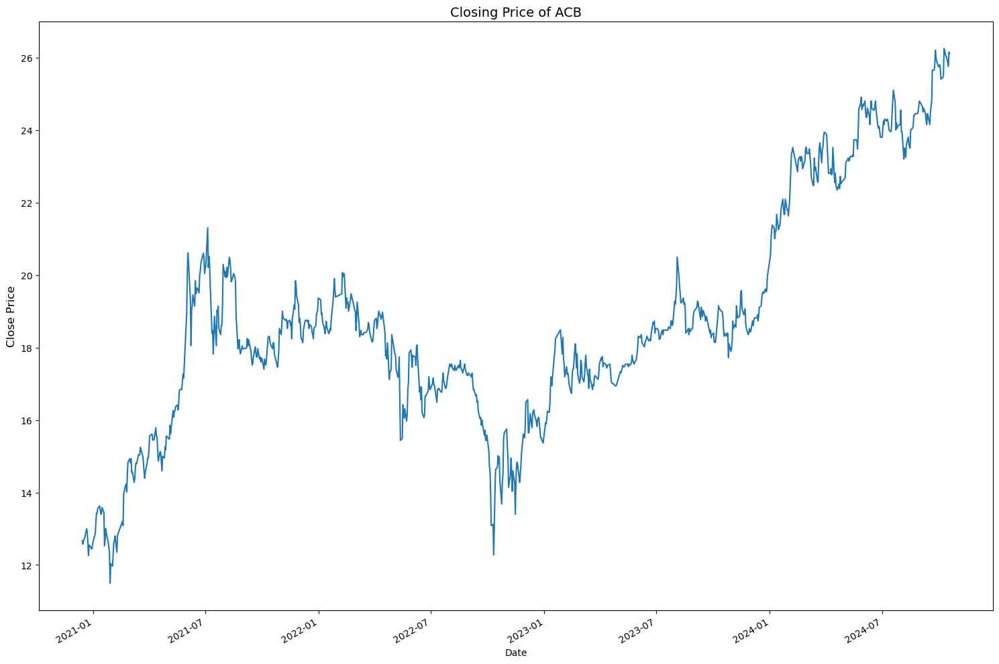

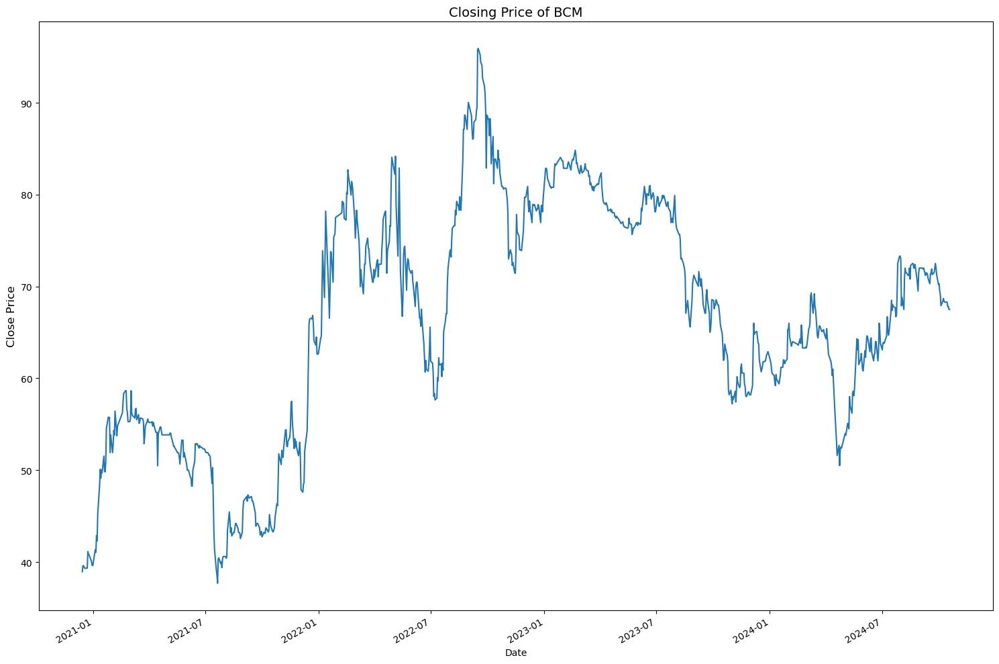

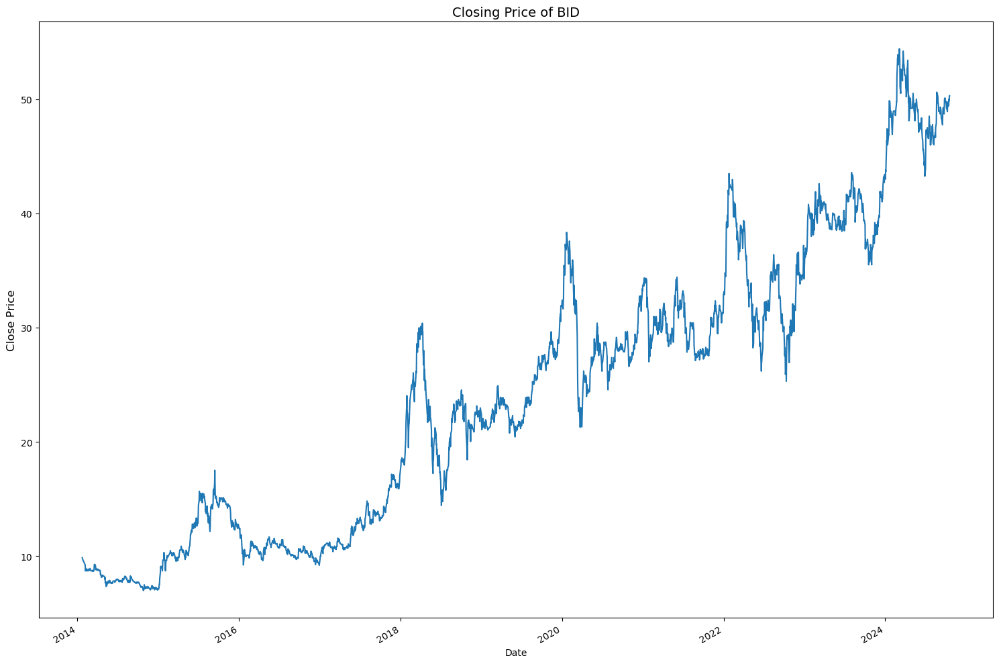

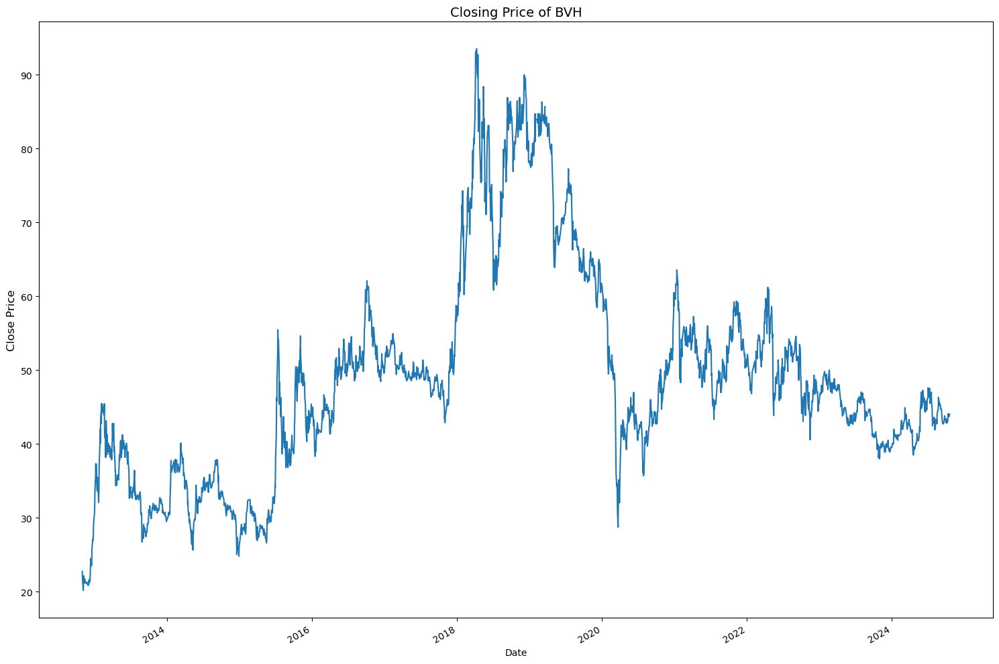

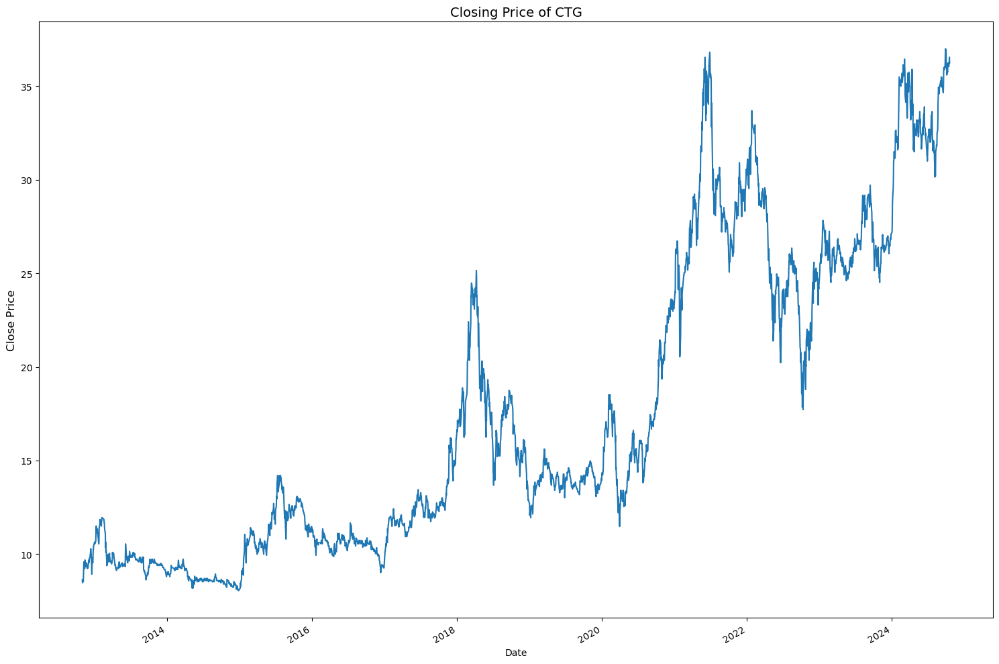

...

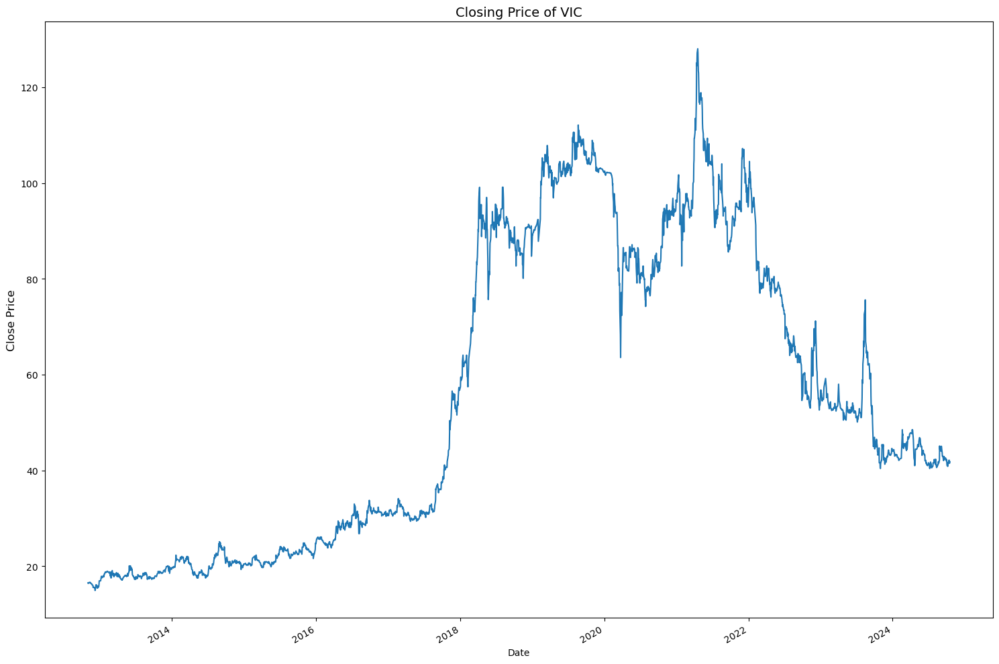

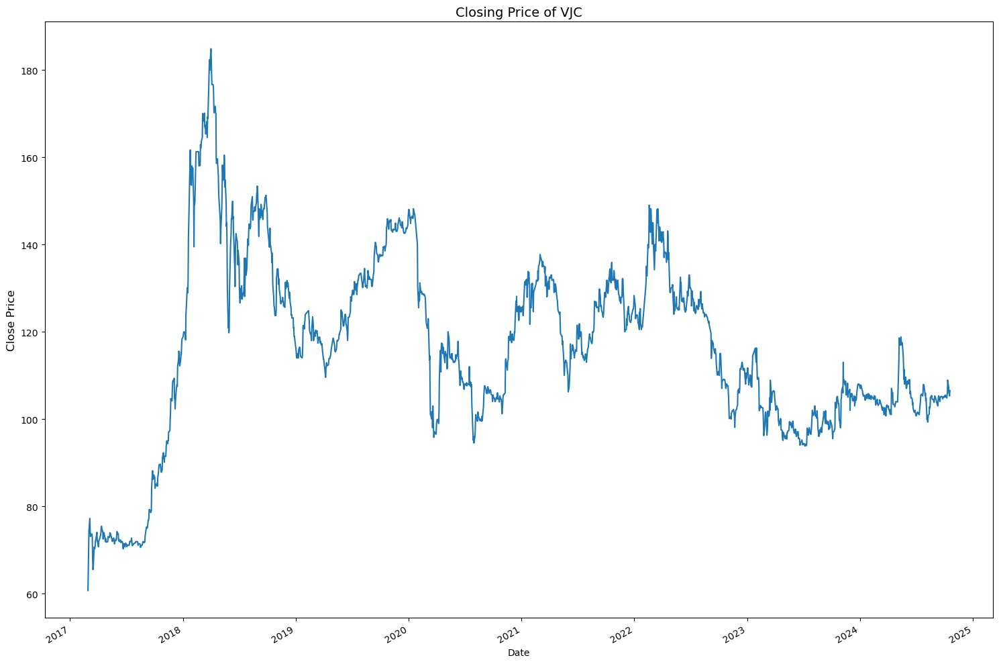

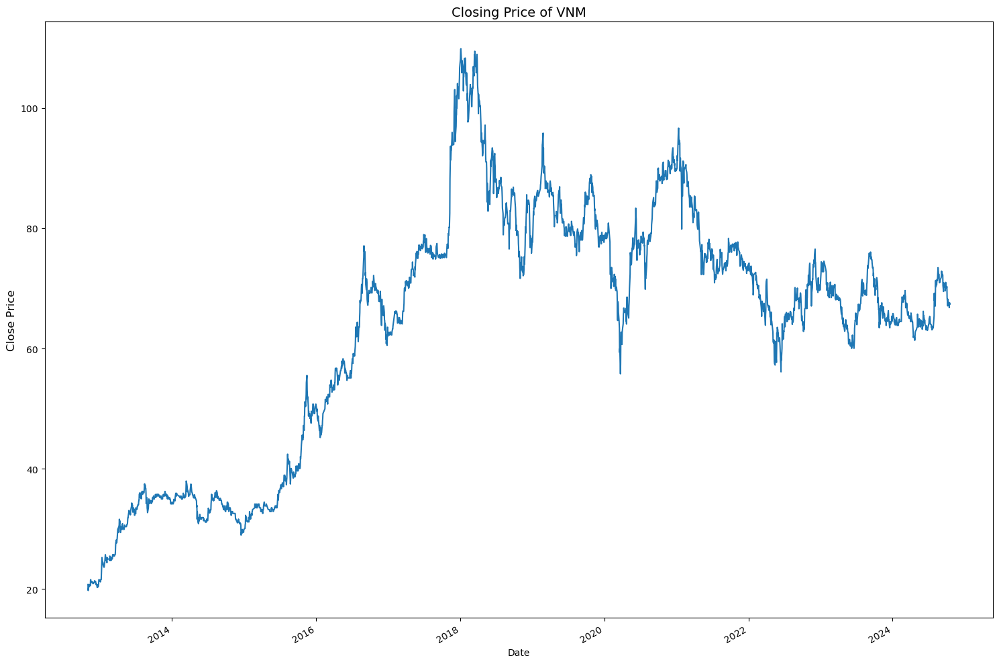

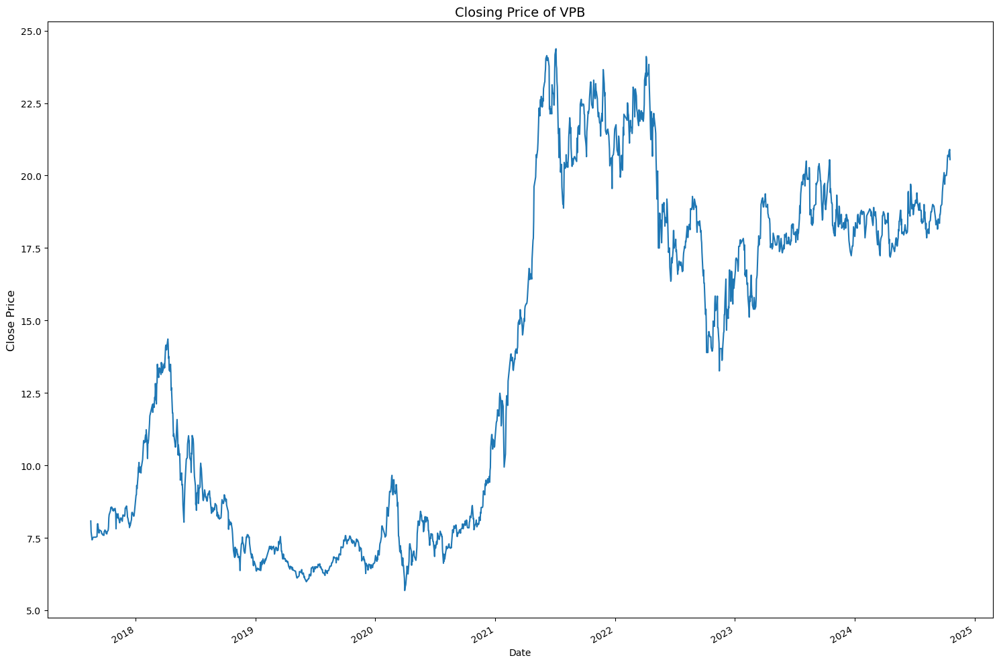

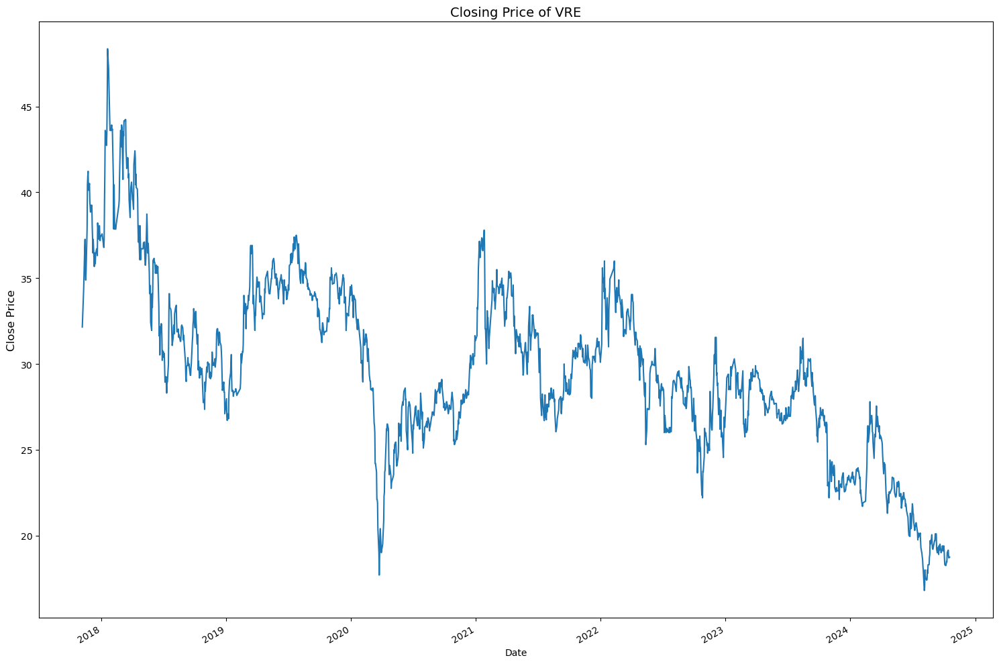

In [14]:
# Trình bày toàn bộ biểu đồ giá đóng theo thứ tự:

for company in companies:
    stock_data = vn30_stocks[vn30_stocks['Ticker'] == company]  
    plt.figure(figsize=(15, 10)) 
    stock_data['Close'].plot()

    plt.ylabel('Close Price', fontsize=12)
    plt.title(f"Closing Price of {company}", fontsize=14)

    plt.tight_layout()
    plt.show()

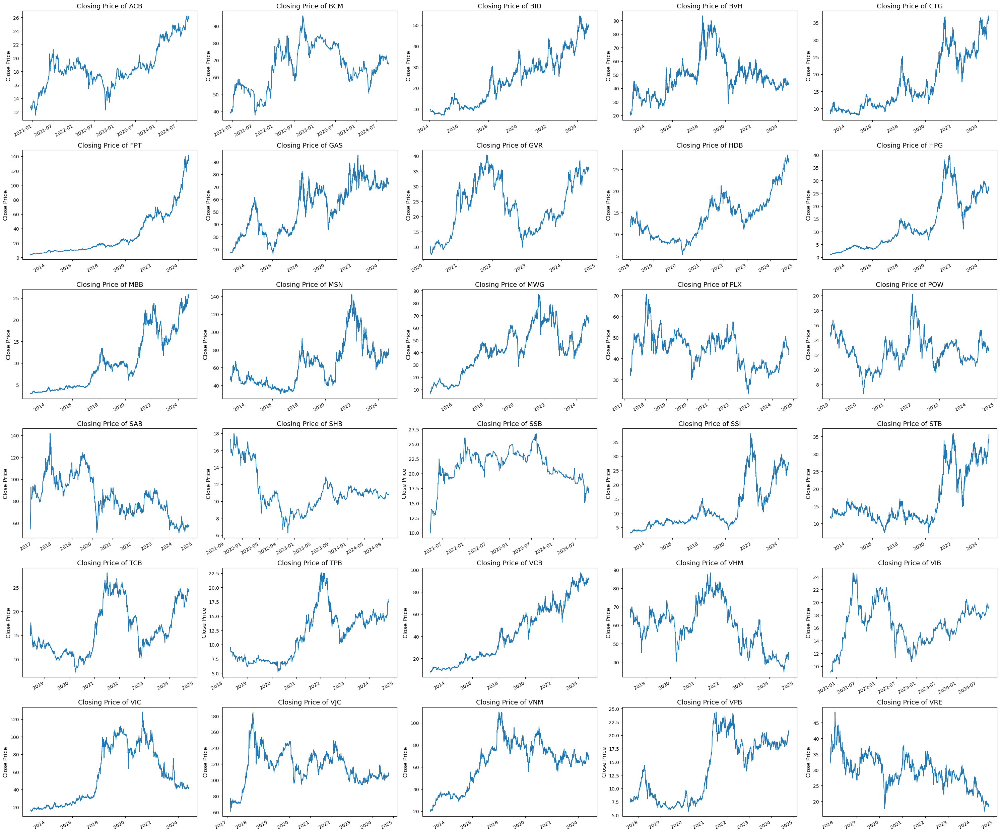

In [15]:
### Tổng hợp các biểu đồ vào 1 figure:
import matplotlib.pyplot as plt

plt.figure(figsize=(30, 25))
plt.subplots_adjust(top=0.95, hspace=0.6)  

for i, company in enumerate(companies, 1):
    plt.subplot(6, 5, i)  
    stock_data = vn30_stocks[vn30_stocks['Ticker'] == company] 
    stock_data['Close'].plot()

    plt.ylabel('Close Price', fontsize=12)
    plt.xlabel(None)
    plt.title(f"Closing Price of {company}", fontsize=14)

plt.tight_layout()
plt.show()

## 2. Volumne of Sales:

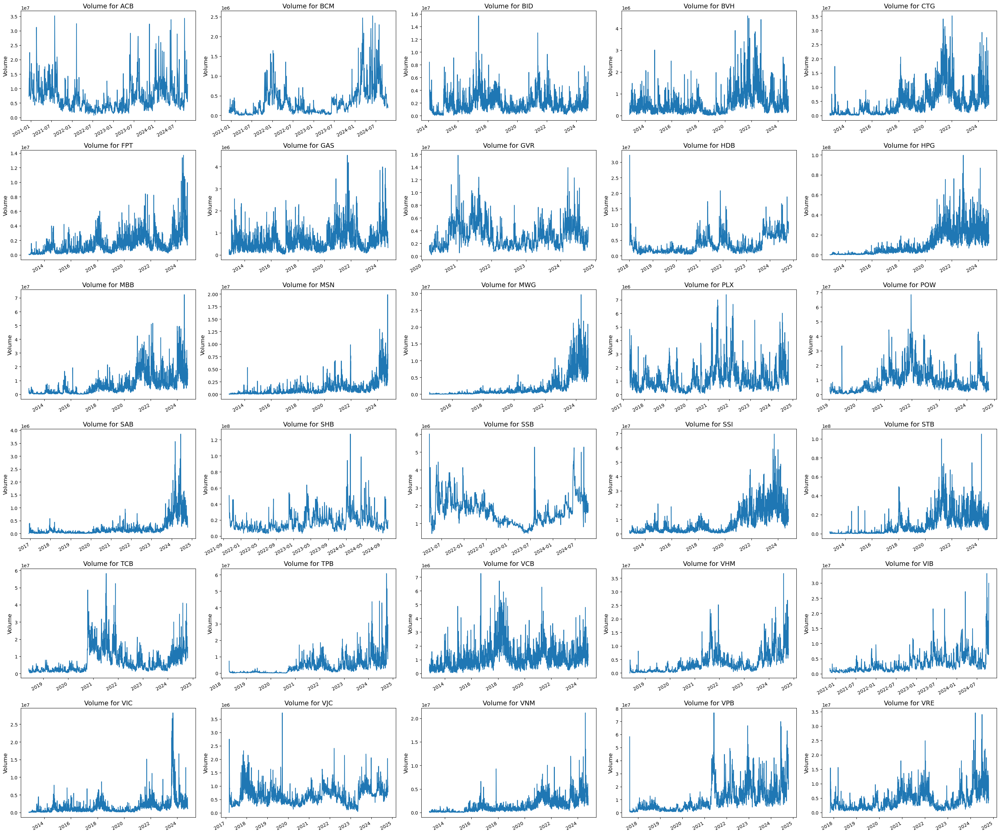

In [16]:
plt.figure(figsize=(30, 25))
plt.subplots_adjust(top=0.95, hspace=0.6)  

for i, company in enumerate(companies, 1):
    stock_data = vn30_stocks[vn30_stocks['Ticker'] == company]  
    plt.subplot(6, 5, i)  
    stock_data['Volume'].plot() 

    plt.ylabel('Volume', fontsize=12)
    plt.xlabel(None)
    plt.title(f"Volume for {company}", fontsize=14)  

plt.tight_layout()
plt.show()

## 3. Determine the Moving Average

Đường MA (viết tắt của cụm từ Moving Average) được gọi là đường trung bình động. Nó được tạo nên bởi trung bình cộng của chuỗi giá trong một khoảng thời gian nhất định. Đường MA thường được tính dựa trên giá của một loại tài sản (chứng khoán, tiền kỹ thuật số,…) hoặc chỉ số (VN-index, HNX-index,…) trong một thời gian cụ thể.

Mục đích chính của đường MA là theo dõi và đánh giá xu hướng của các loại tài sản hoặc chỉ số. Từ đó nhà đầu tư có thể rút ra kết luận về xu hướng tăng, giảm hay đi ngang. Đường MA là chỉ báo trễ (lagging indicator) diễn biến có thực trên thị trường để đưa ra xu hướng. 

In [17]:
# Xác định trung bình động trong 10, 20, và 50 ngày
ma_days = [10, 20, 50]

In [18]:
# Tính toán Moving Average cho từng mã cổ phiếu
for ma in ma_days:
    for company in companies:
        stock_data = vn30_stocks[vn30_stocks['Ticker'] == company].copy()  
        column_name = f"MA for {ma} days"
        stock_data[column_name] = stock_data['Close'].rolling(ma).mean()
    
        vn30_stocks.loc[vn30_stocks['Ticker'] == company, column_name] = stock_data[column_name]

<Figure size 1200x600 with 0 Axes>

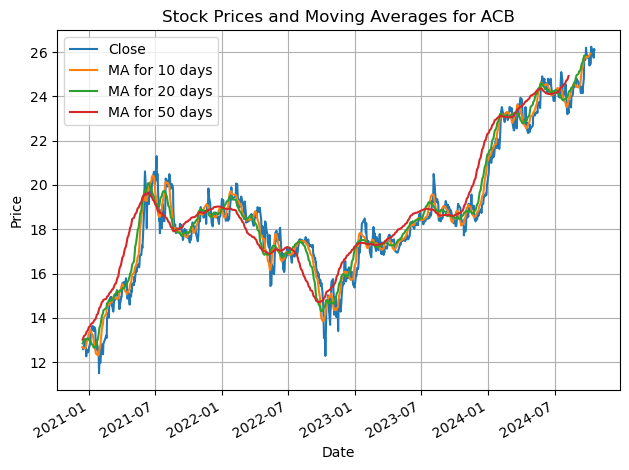

<Figure size 1200x600 with 0 Axes>

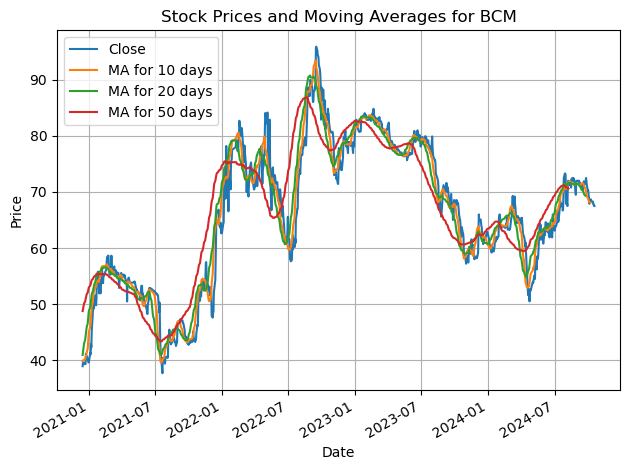

<Figure size 1200x600 with 0 Axes>

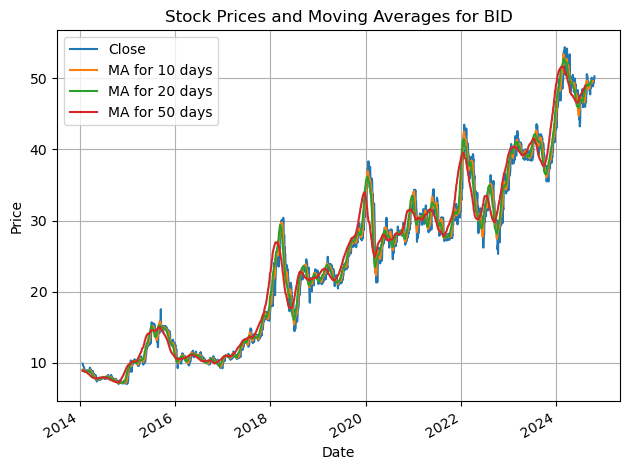

<Figure size 1200x600 with 0 Axes>

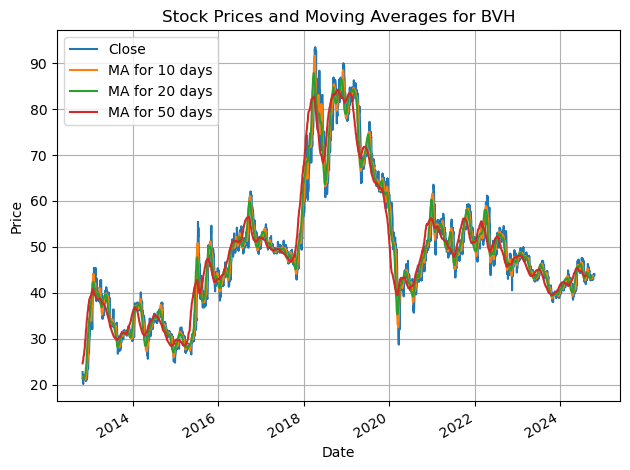

<Figure size 1200x600 with 0 Axes>

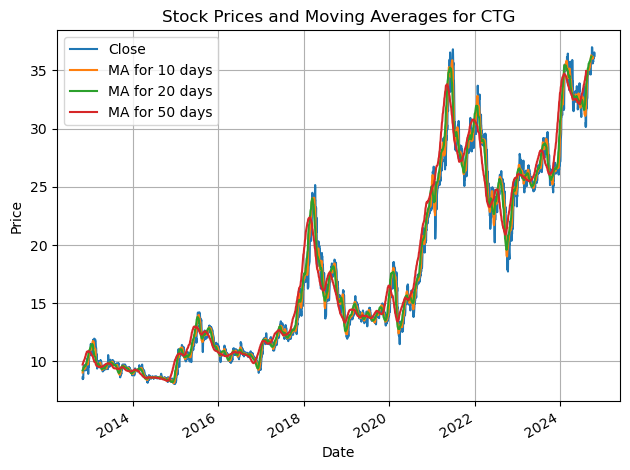

<Figure size 1200x600 with 0 Axes>

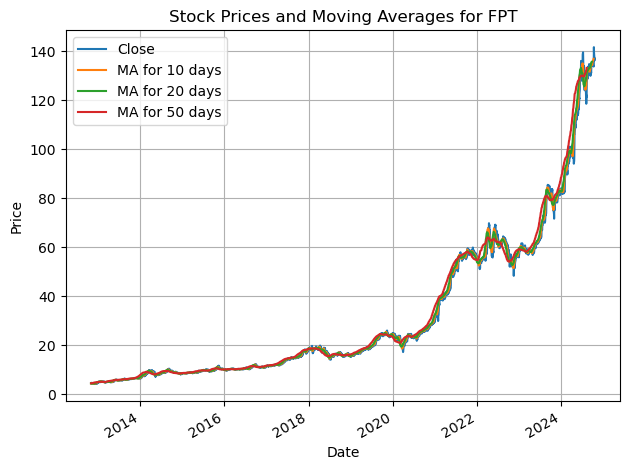

<Figure size 1200x600 with 0 Axes>

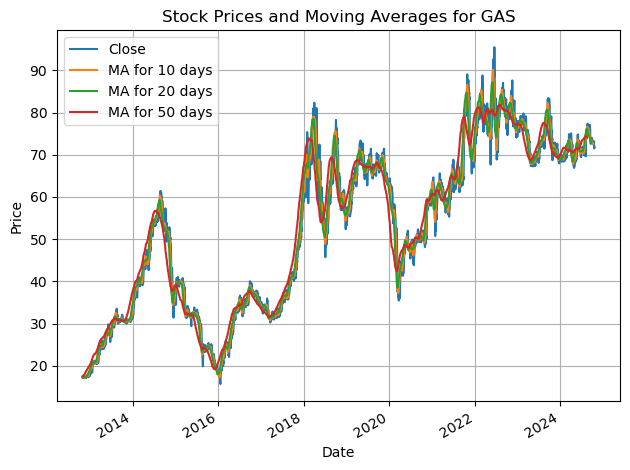

<Figure size 1200x600 with 0 Axes>

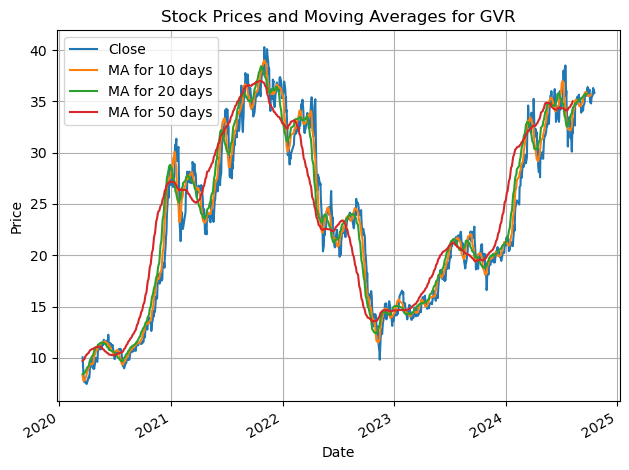

<Figure size 1200x600 with 0 Axes>

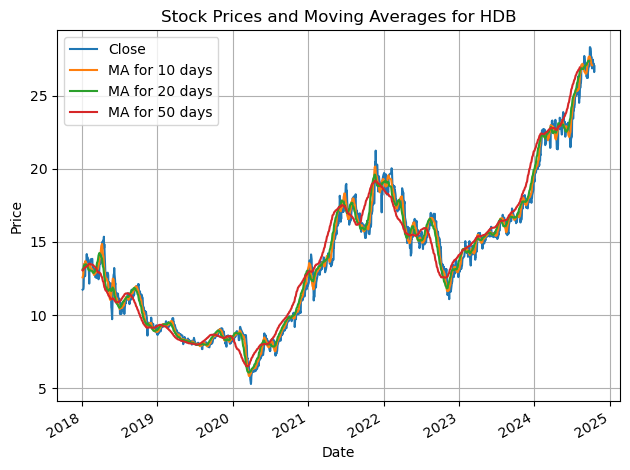

<Figure size 1200x600 with 0 Axes>

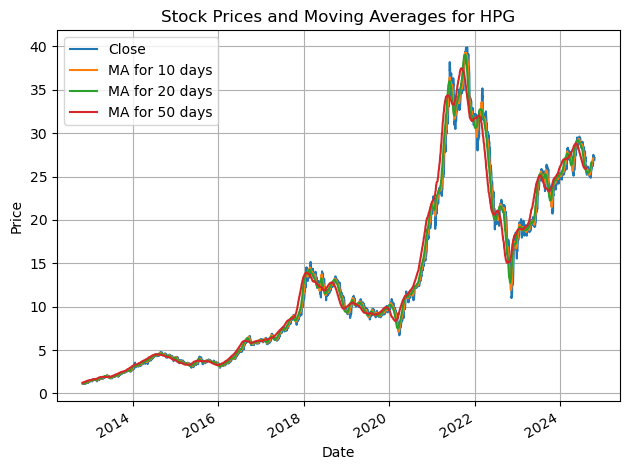

<Figure size 1200x600 with 0 Axes>

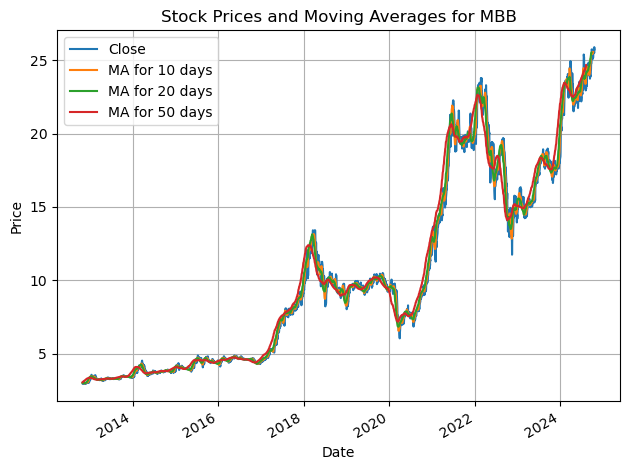

<Figure size 1200x600 with 0 Axes>

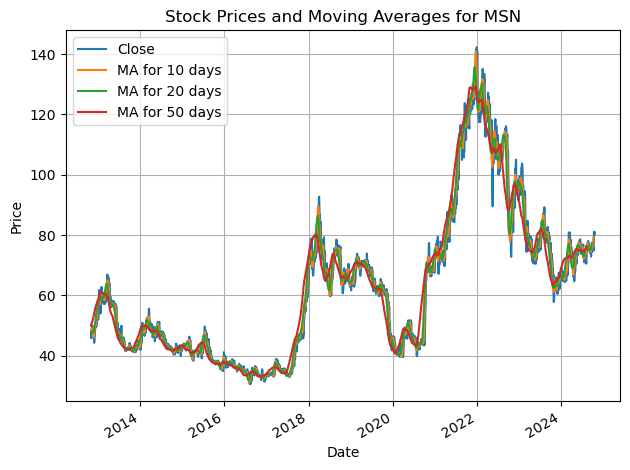

<Figure size 1200x600 with 0 Axes>

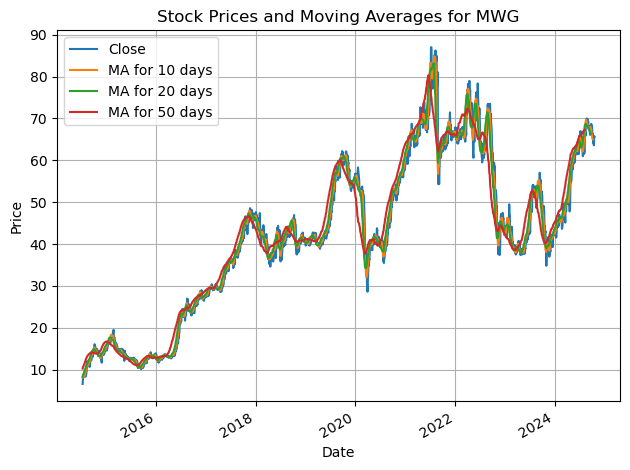

<Figure size 1200x600 with 0 Axes>

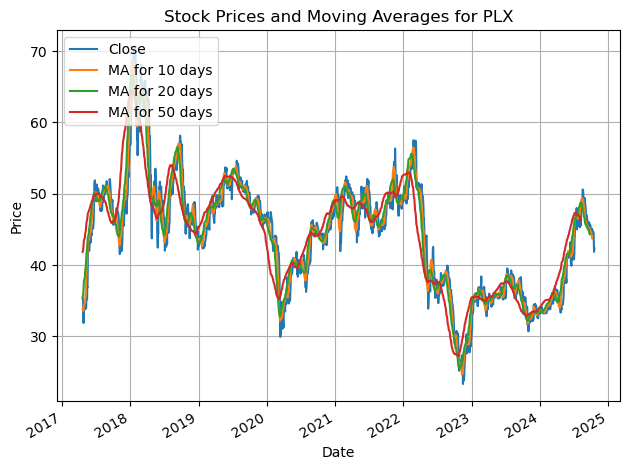

<Figure size 1200x600 with 0 Axes>

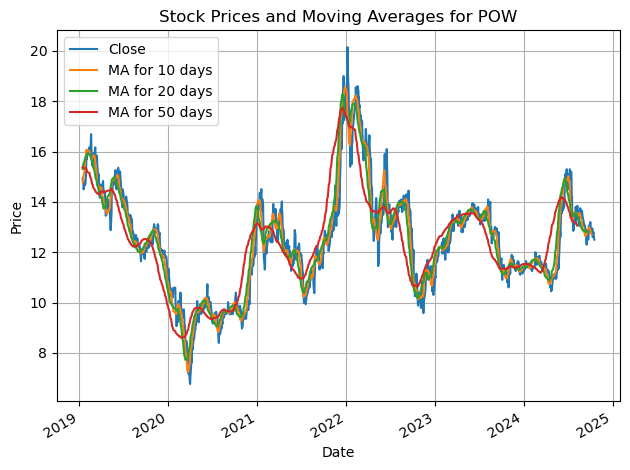

<Figure size 1200x600 with 0 Axes>

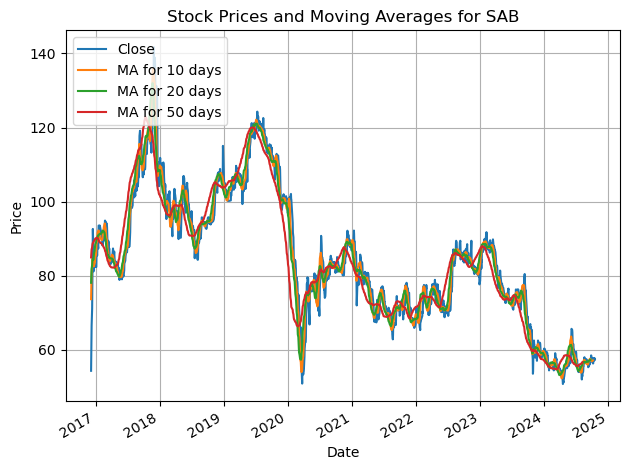

<Figure size 1200x600 with 0 Axes>

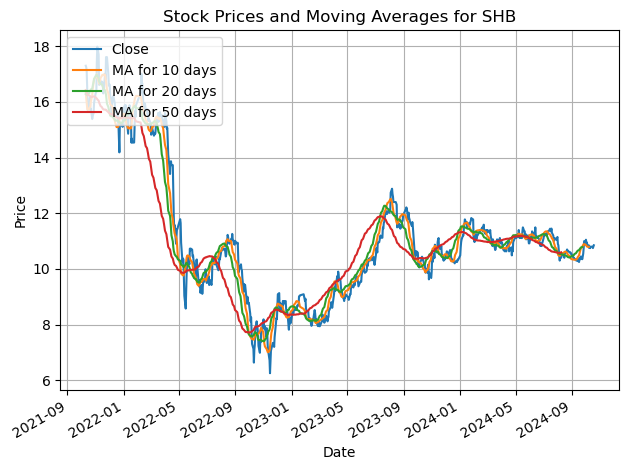

<Figure size 1200x600 with 0 Axes>

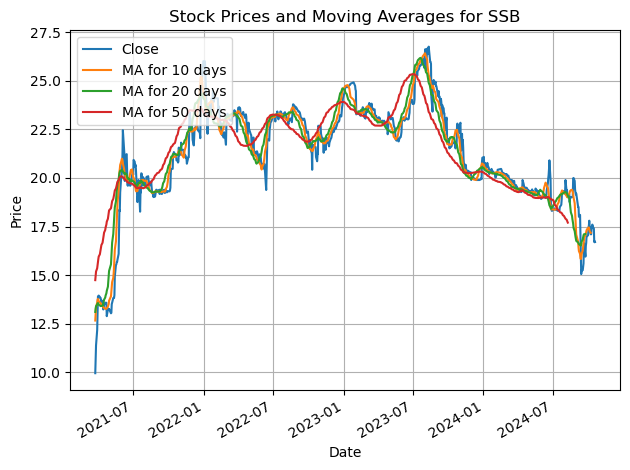

<Figure size 1200x600 with 0 Axes>

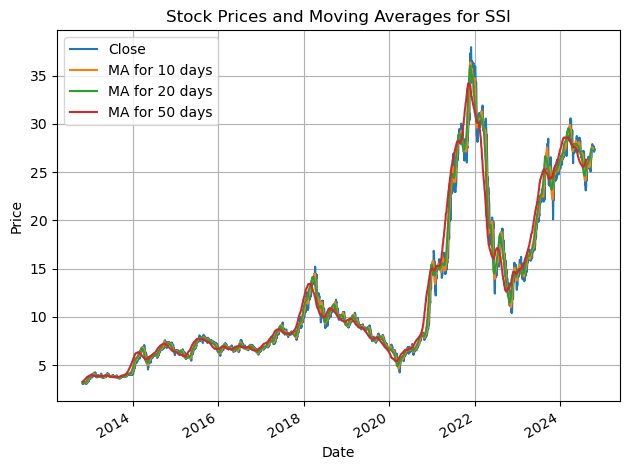

<Figure size 1200x600 with 0 Axes>

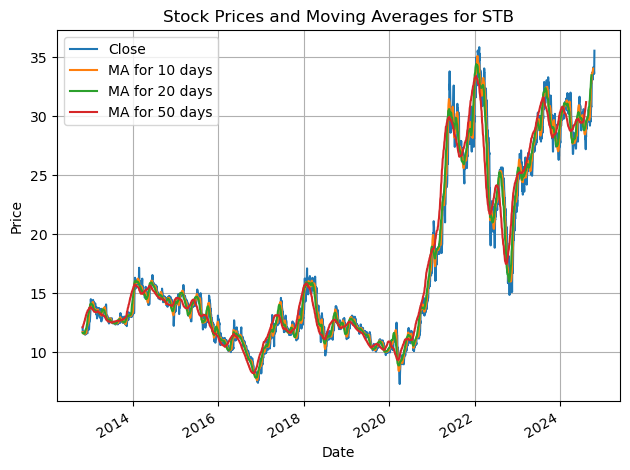

<Figure size 1200x600 with 0 Axes>

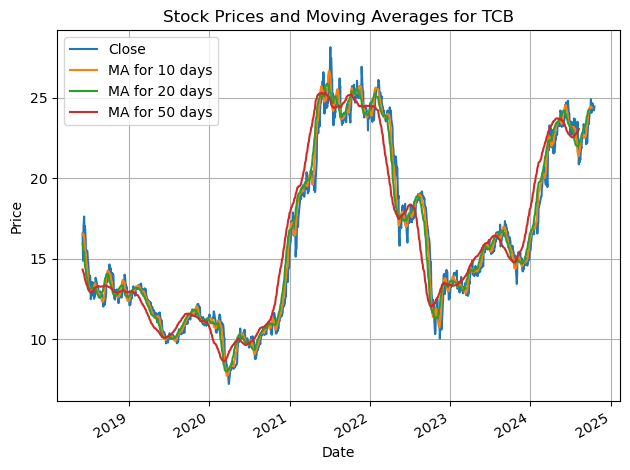

<Figure size 1200x600 with 0 Axes>

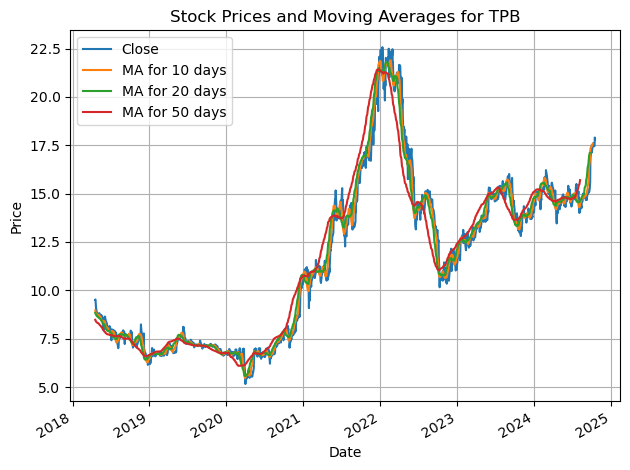

<Figure size 1200x600 with 0 Axes>

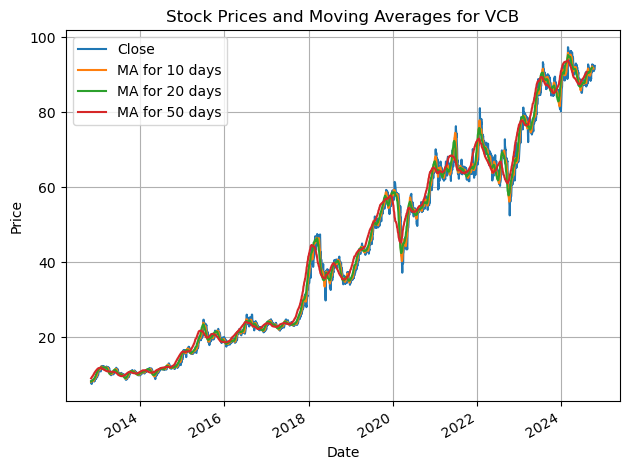

<Figure size 1200x600 with 0 Axes>

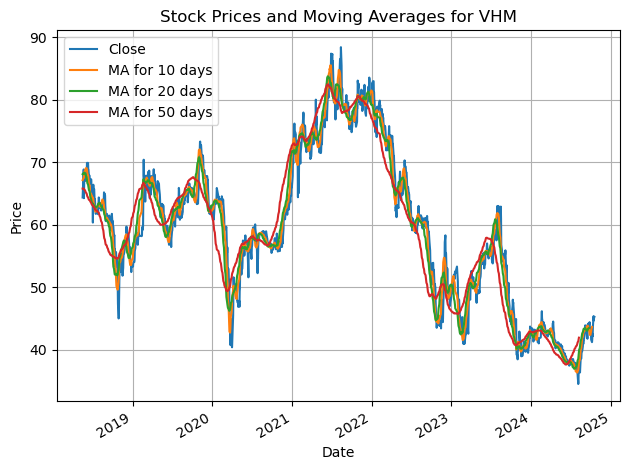

<Figure size 1200x600 with 0 Axes>

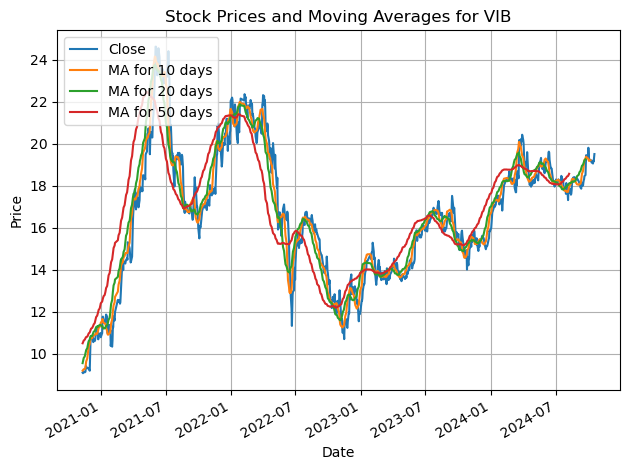

<Figure size 1200x600 with 0 Axes>

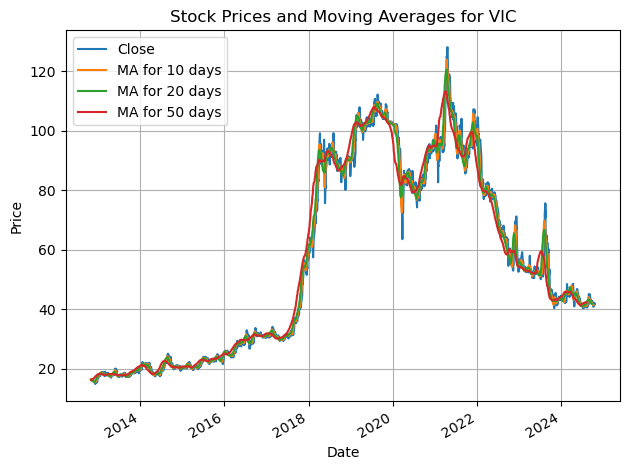

<Figure size 1200x600 with 0 Axes>

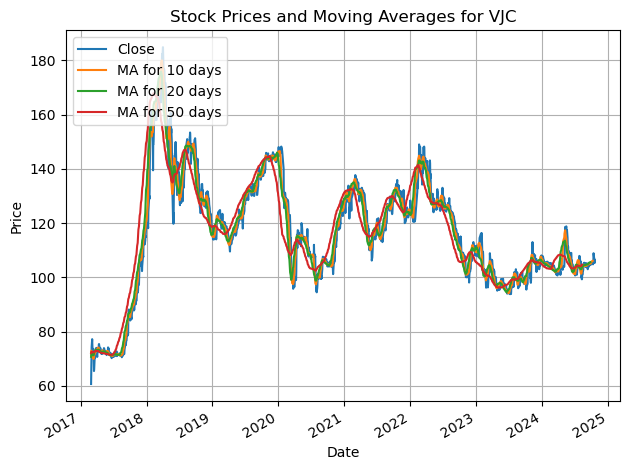

<Figure size 1200x600 with 0 Axes>

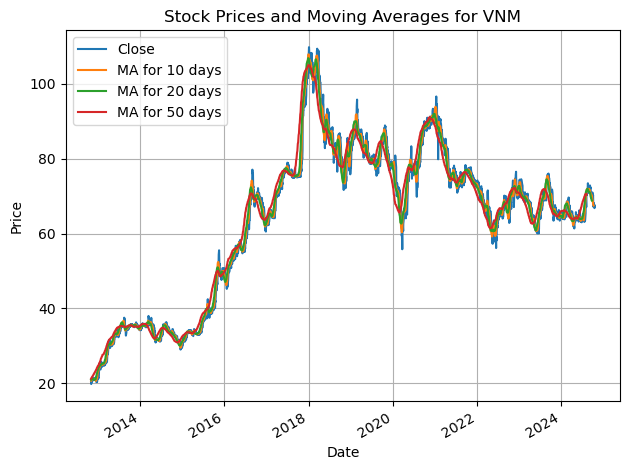

<Figure size 1200x600 with 0 Axes>

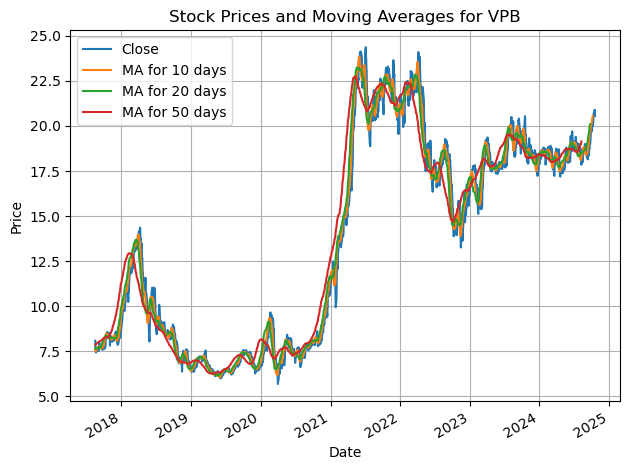

<Figure size 1200x600 with 0 Axes>

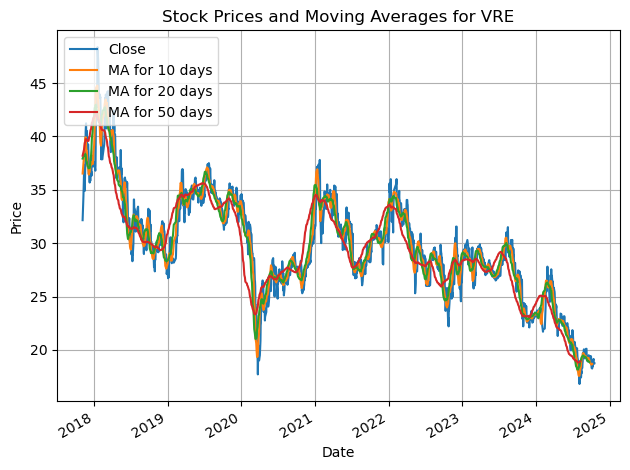

In [19]:
# Vẽ biểu đồ:
for company in companies:
    stock_data = vn30_stocks[vn30_stocks['Ticker'] == company]

    plt.figure(figsize=(12, 6))  
    stock_data[['Close', 'MA for 10 days', 'MA for 20 days', 'MA for 50 days']].plot()
    plt.title(f"Stock Prices and Moving Averages for {company}")
    plt.ylabel('Price')
    plt.xlabel('Date')
    plt.legend(loc='upper left')
    plt.grid()
    plt.tight_layout()
    plt.show() 

## 4. Average daily return of the stock:

Daily return (tỷ lệ hoàn vốn hàng ngày) là một chỉ số đo lường mức thay đổi giá của một cổ phiếu trong một ngày giao dịch so với ngày trước đó. Nó được tính bằng cách lấy tỷ lệ phần trăm giữa giá đóng cửa của cổ phiếu trong ngày hiện tại và giá đóng cửa của ngày trước đó. 

Tỷ lệ hoàn vốn hàng ngày giúp nhà đầu tư hiểu rõ hơn về mức độ biến động của cổ phiếu và có thể dùng để phân tích hiệu suất đầu tư hoặc đánh giá rủi ro liên quan đến việc nắm giữ cổ phiếu.

In [20]:
daily_returns = pd.DataFrame()

In [21]:
for company in companies:
    stock_data = vn30_stocks[vn30_stocks['Ticker'] == company].copy()
    stock_data = stock_data.sort_values(by='Date') 
    
    stock_data['Daily Return'] = stock_data['Close'].pct_change()
    daily_returns = pd.concat([daily_returns, stock_data])

vn30_stocks = vn30_stocks.sort_values(by=['Ticker', 'Date'])

vn30_stocks['Daily Return'] = daily_returns['Daily Return'].values

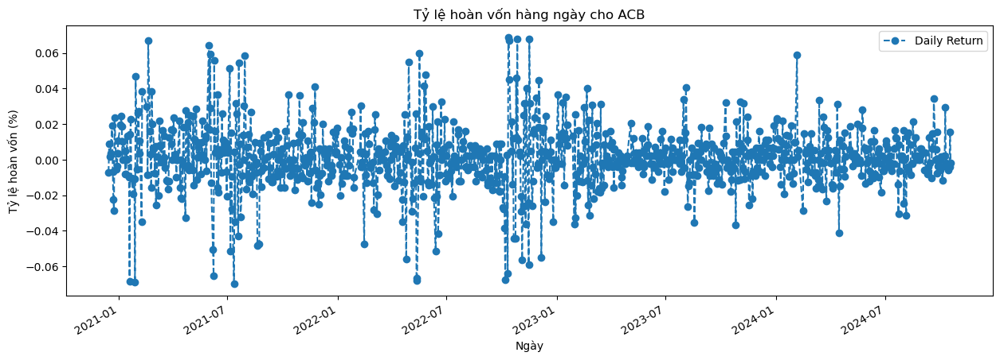

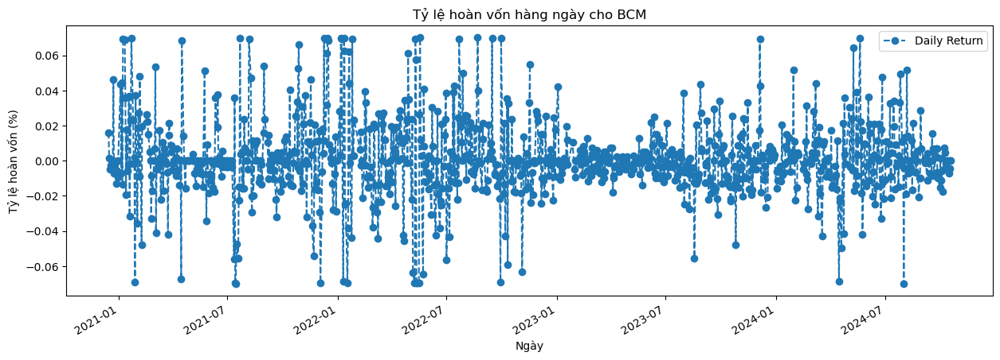

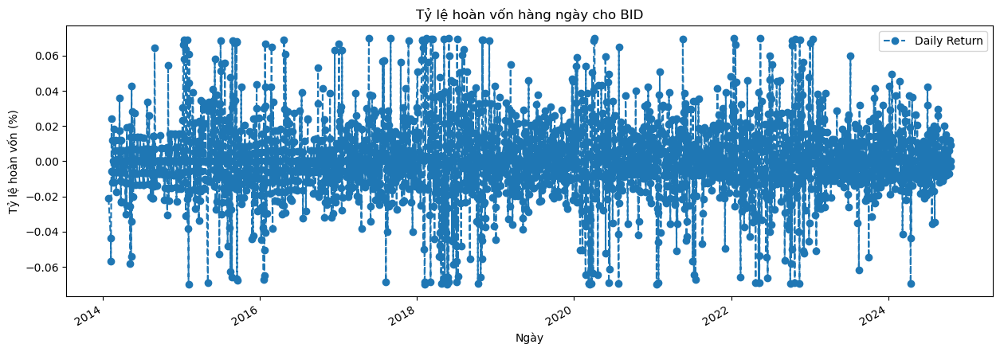

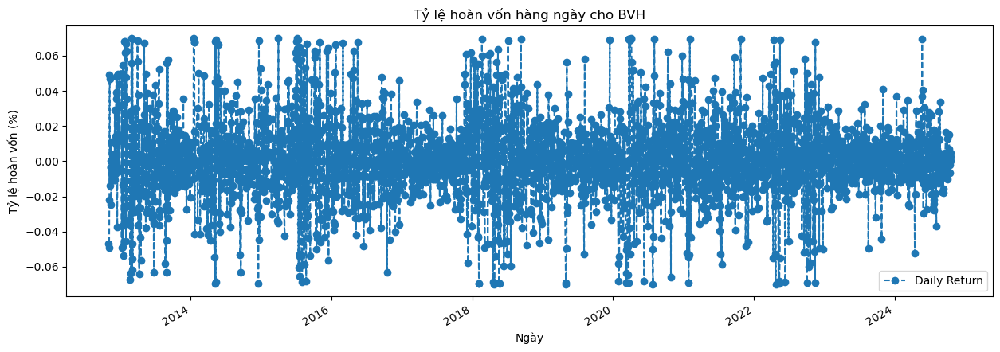

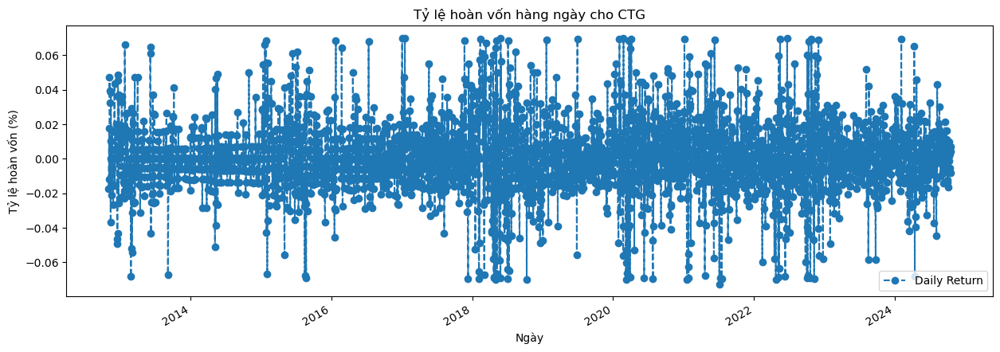

...

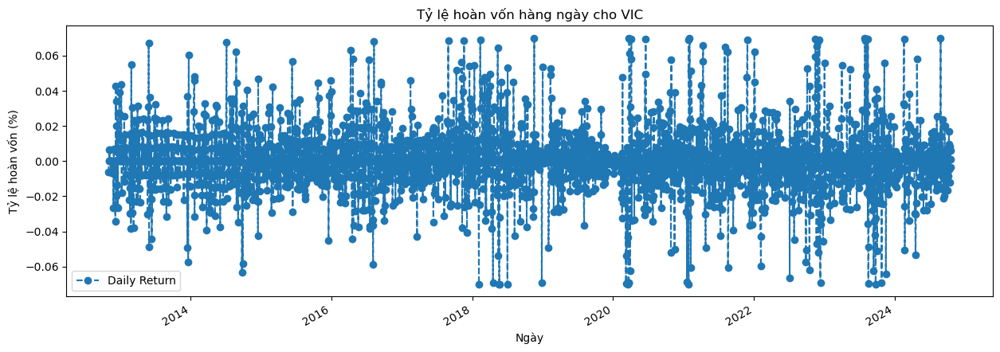

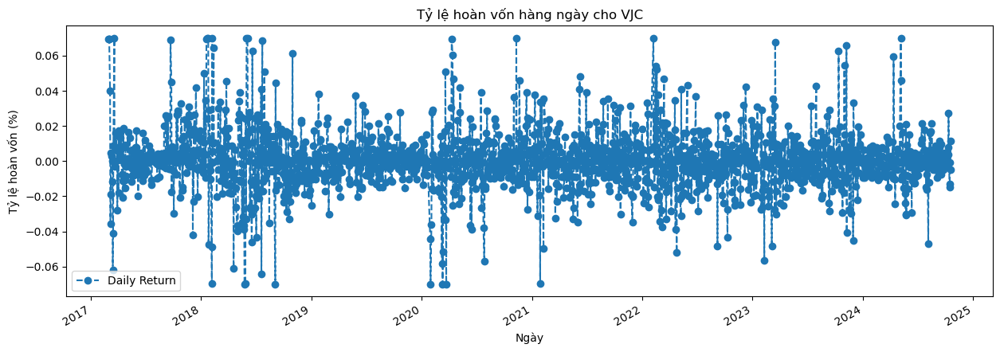

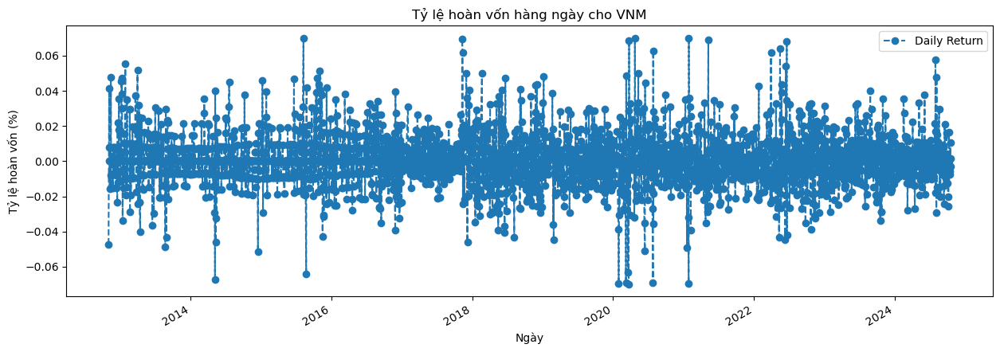

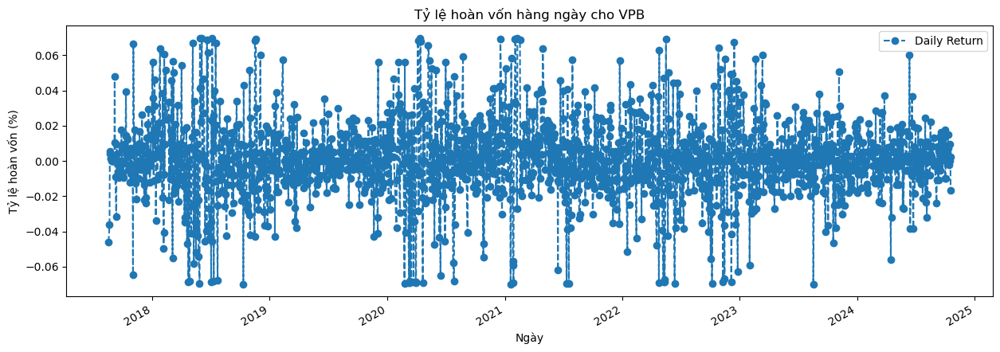

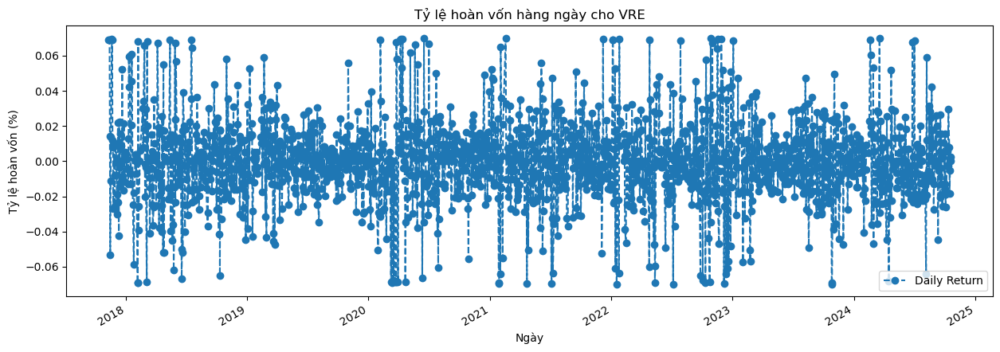

In [22]:
for company in companies:
    stock_data = vn30_stocks[vn30_stocks['Ticker'] == company]
    plt.figure(figsize=(15, 5)) 
    stock_data['Daily Return'].plot(legend=True, linestyle='--', marker='o') 
    plt.title(f"Tỷ lệ hoàn vốn hàng ngày cho {company}")  
    plt.ylabel('Tỷ lệ hoàn vốn (%)')  
    plt.xlabel('Ngày')  
    plt.show() 

## 5. Correlation between different stocks closing prices

Mối tương quan (Correlation) trong lĩnh vực tài chính và phân tích chứng khoán giúp nhà đầu tư có thể:

Đánh giá rủi ro: Nếu hai cổ phiếu có mối tương quan cao (gần +1), điều này có thể cho thấy rằng chúng di chuyển theo cùng một hướng. Điều này có thể làm tăng rủi ro trong danh mục đầu tư, vì nếu một cổ phiếu giảm, cổ phiếu còn lại cũng có khả năng giảm.
    
Tìm kiếm cơ hội đầu tư: Nếu hai cổ phiếu có mối tương quan thấp hoặc âm (gần -1), điều này có thể cho thấy rằng chúng di chuyển độc lập. Việc kết hợp các cổ phiếu như vậy có thể giảm rủi ro cho danh mục đầu tư.

**Quan sát mối tương quan giữa closing price/daily return giữa các cổ phiếu theo lĩnh vực hoạt động**

Để phân tích mối tương quan giữa closing price/daily return của các cổ phiếu trong danh sách VN30 và chia chúng theo lĩnh vực hoạt động, trước tiên, cần có một danh sách các công ty VN30 cùng với lĩnh vực của từng công ty

In [23]:
# Danh sách mã cổ phiếu và lĩnh vực hoạt động tương ứng
industry_data = {
    'Ticker': ['ACB', 'BCM', 'BID', 'BVH', 'CTG', 'FPT', 'GAS', 'GVR', 'HDB', 'HPG',
               'MBB', 'MSN', 'MWG', 'PLX', 'POW', 'SAB', 'SHB', 'SSB', 'SSI', 'STB',
               'TCB', 'TPB', 'VCB', 'VHM', 'VIB', 'VIC', 'VJC', 'VNM', 'VPB', 'VRE'],
    'Industry': ['Ngân hàng', 'Khu công nghiệp', 'Ngân hàng', 'Bảo hiểm', 'Ngân hàng', 'Công nghệ', 
                 'Năng lượng', 'Công nghiệp', 'Ngân hàng', 'Thép', 'Ngân hàng', 'Bán lẻ', 
                 'Bán lẻ', 'Năng lượng', 'Năng lượng', 'Thực phẩm', 'Ngân hàng', 
                 'Ngân hàng', 'Chứng khoán', 'Ngân hàng', 'Ngân hàng', 'Ngân hàng', 
                 'Ngân hàng', 'Bất động sản', 'Ngân hàng', 'Đa ngành', 'Hàng không', 
                 'Thực phẩm', 'Ngân hàng', 'Bán lẻ']
}

In [24]:
industry_df = pd.DataFrame(industry_data)

In [25]:
#reset_index để giữ cột date
vn30_stocks.reset_index(inplace=True)

In [26]:
# Thực hiện việc kết hợp dữ liệu từ industry_df sang vn30_stocks
vn30_stocks_merged = pd.merge(vn30_stocks, industry_df, on='Ticker', how='left')

In [27]:
vn30_stocks_merged.set_index('Date', inplace = True)

In [28]:
vn30_stocks_merged.drop(columns = ['MA for 10 days', 'MA for 20 days', 'MA for 50 days'], inplace = True)

In [29]:
vn30_stocks_merged

,Ticker,Open,High,Low,Close,Volume,Daily Return,Industry
Date,,,,,,,,
2020-12-14,ACB,12.7067,12.7965,12.6169,12.6634,7325960,NaN,Ngân hàng
2020-12-15,ACB,12.6618,12.6843,12.5271,12.5736,7305490,-0.007091,Ngân hàng
2020-12-16,ACB,12.5720,12.7741,12.5720,12.6859,10461450,0.008931,Ngân hàng
2020-12-17,ACB,12.6169,12.9537,12.5945,12.7083,13567290,0.001766,Ngân hàng
2020-12-18,ACB,12.7741,12.8639,12.7067,12.7532,11693630,0.003533,Ngân hàng
...,...,...,...,...,...,...,...,...
2024-10-14,VRE,19.4000,19.6000,19.0500,19.1500,11560900,0.007895,Bán lẻ
2024-10-15,VRE,19.1500,19.2000,18.8000,18.8000,6684800,-0.018277,Bán lẻ
2024-10-16,VRE,18.8000,18.9000,18.6500,18.7000,4185200,-0.005319,Bán lẻ


In [30]:
vn30_stocks_merged.loc['2014-10-13']

,Ticker,Open,High,Low,Close,Volume,Daily Return,Industry
Date,,,,,,,,
2014-10-13,HPG,4.5572,4.5572,4.4793,4.5583,805500,0.000000,Thép
2014-10-13,MBB,3.8475,3.9029,3.8198,3.8759,3493510,0.021883,Ngân hàng
2014-10-13,MSN,41.9481,42.2054,41.6907,41.6937,73360,-0.006136,Bán lẻ
2014-10-13,MWG,15.8125,15.8125,15.2625,15.4000,17150,-0.042735,Bán lẻ
2014-10-13,SSI,7.3012,7.4682,7.3012,7.3994,5541370,0.016387,Chứng khoán
2014-10-13,STB,14.4591,14.6129,14.2284,14.3071,162900,-0.010642,Ngân hàng
2014-10-13,VCB,11.9475,11.9475,11.8148,11.9499,213690,0.000000,Ngân hàng
2014-10-13,VIC,20.8688,21.2124,20.8688,20.9580,1207120,0.004111,Đa ngành
2014-10-13,VNM,34.1388,34.4520,33.8256,34.1488,89590,-0.009088,Thực phẩm


In [31]:
industry_df = pd.DataFrame(industry_data)

vn30_stocks = pd.merge(vn30_stocks, industry_df, on='Ticker', how='left')

correlation_results = {}

for industry in vn30_stocks['Industry'].unique():
    industry_data = vn30_stocks[vn30_stocks['Industry'] == industry]
    close_prices = industry_data.pivot(index='Date', columns='Ticker', values='Close')
    daily_returns = industry_data.pivot(index='Date', columns='Ticker', values='Daily Return')
    
    correlation_close = close_prices.corr()
    correlation_daily_return = daily_returns.corr()
    
    correlation_results[industry] = {
        'Close Price Correlation': correlation_close,
        'Daily Return Correlation': correlation_daily_return
    }

In [32]:
correlation_results

{'Ngân hàng': {'Close Price Correlation': Ticker       ACB       BID       CTG       HDB       MBB       SHB       SSB  \
  Ticker                                                                         
  ACB     1.000000  0.790391  0.822504  0.948911  0.893520  0.236238 -0.292193   
  BID     0.790391  1.000000  0.913334  0.804527  0.909020 -0.039472 -0.061408   
  CTG     0.822504  0.913334  1.000000  0.924467  0.969932  0.418002 -0.412778   
  HDB     0.948911  0.804527  0.924467  1.000000  0.951855  0.299076 -0.365808   
  MBB     0.893520  0.909020  0.969932  0.951855  1.000000  0.534125 -0.274799   
  SHB     0.236238 -0.039472  0.418002  0.299076  0.534125  1.000000  0.064161   
  SSB    -0.292193 -0.061408 -0.412778 -0.365808 -0.274799  0.064161  1.000000   
  STB     0.747716  0.774519  0.891691  0.890988  0.883346  0.611936  0.031773   
  TCB     0.504439  0.502181  0.847322  0.824852  0.879658  0.789042 -0.392192   
  TPB     0.427511  0.663107  0.850451  0.828564  0.913081

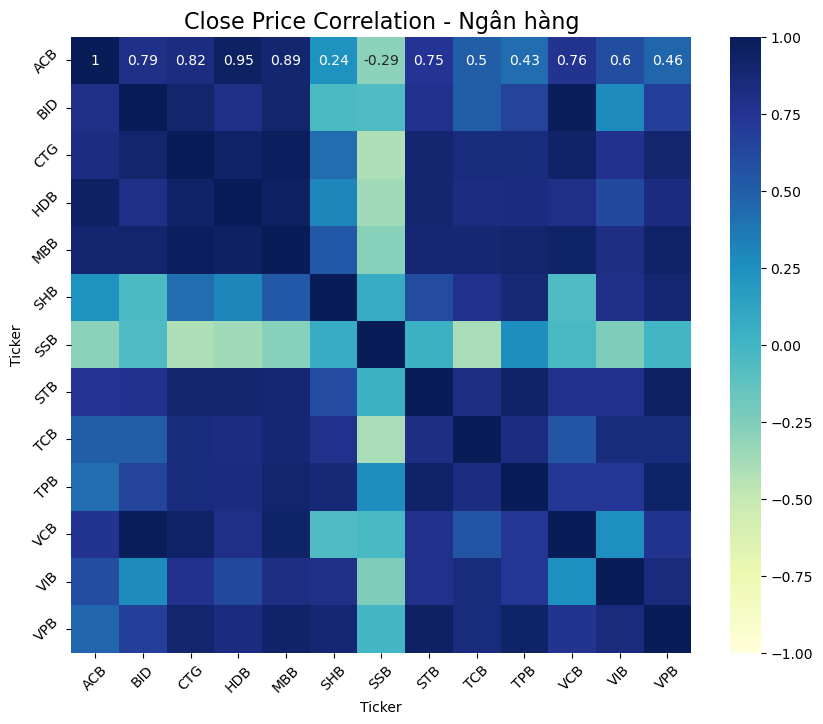

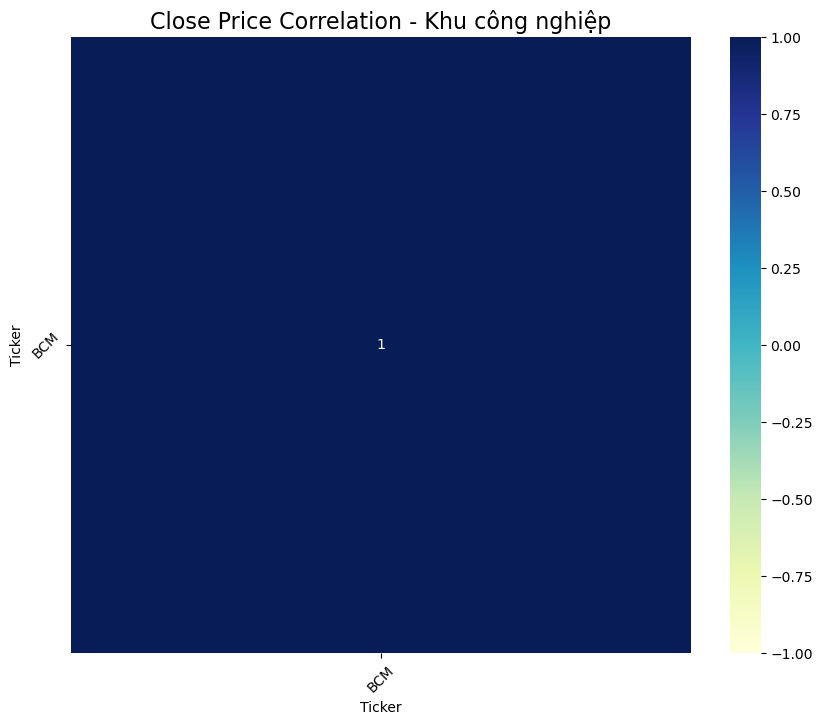

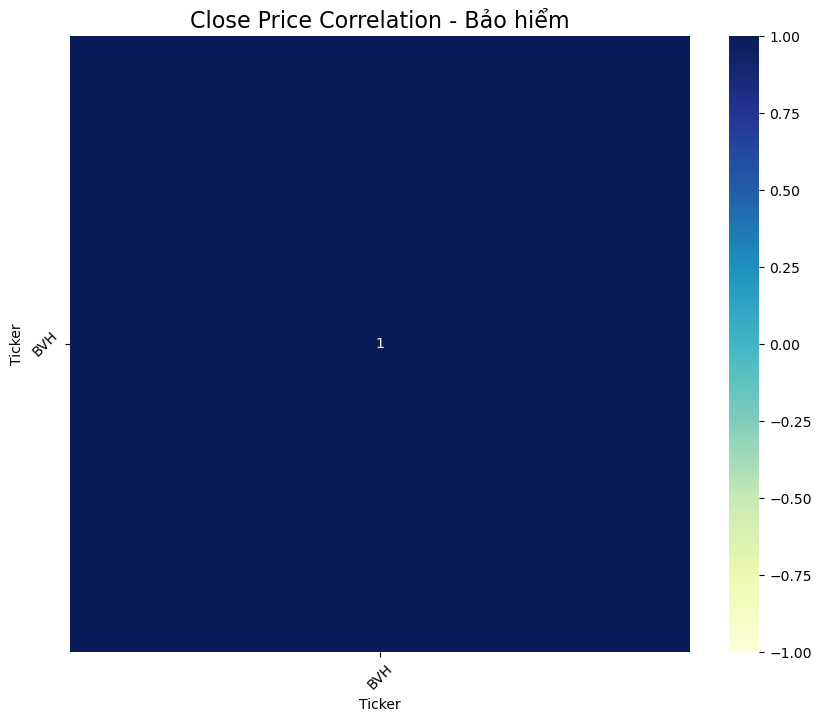

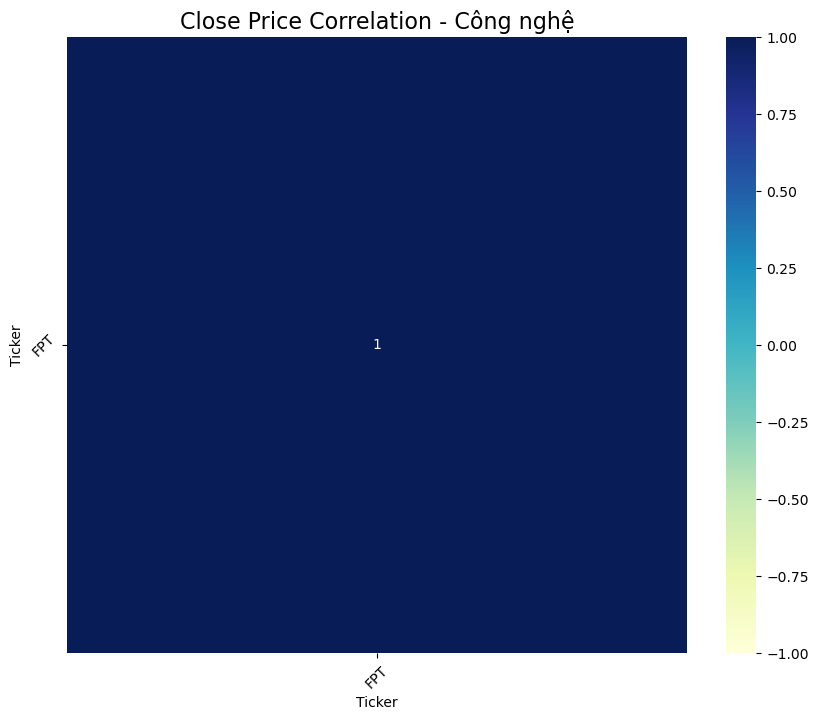

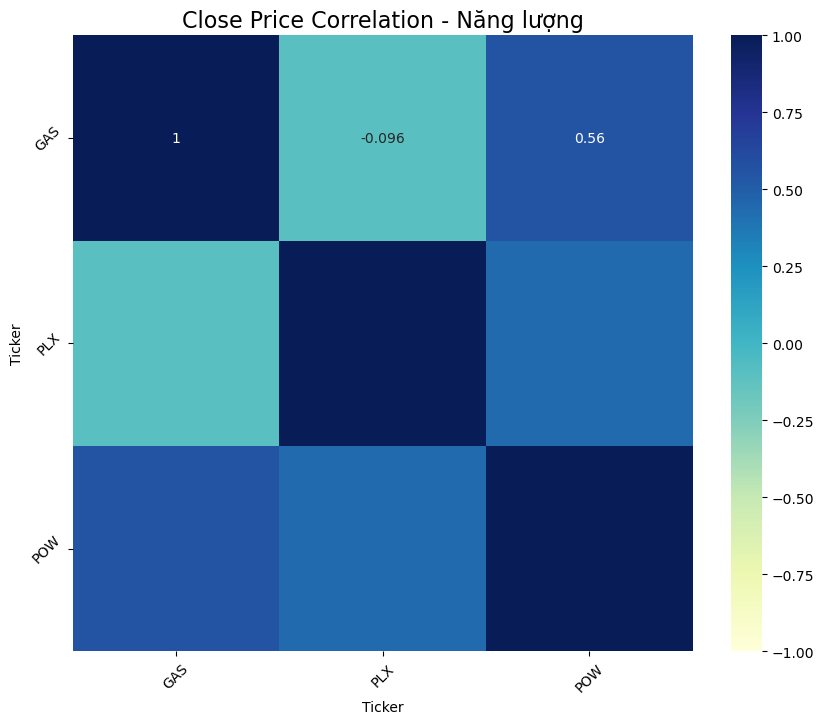

...

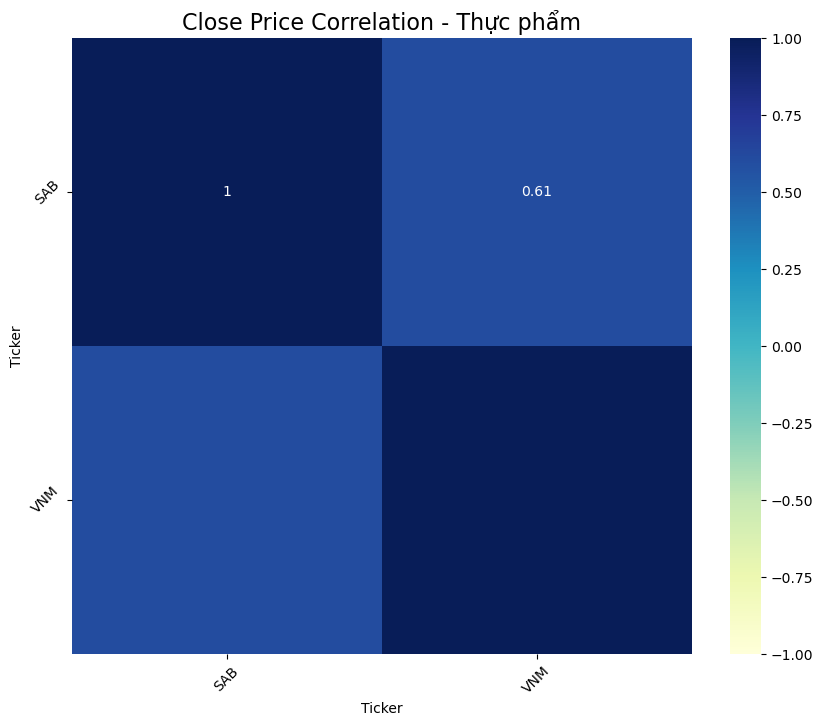

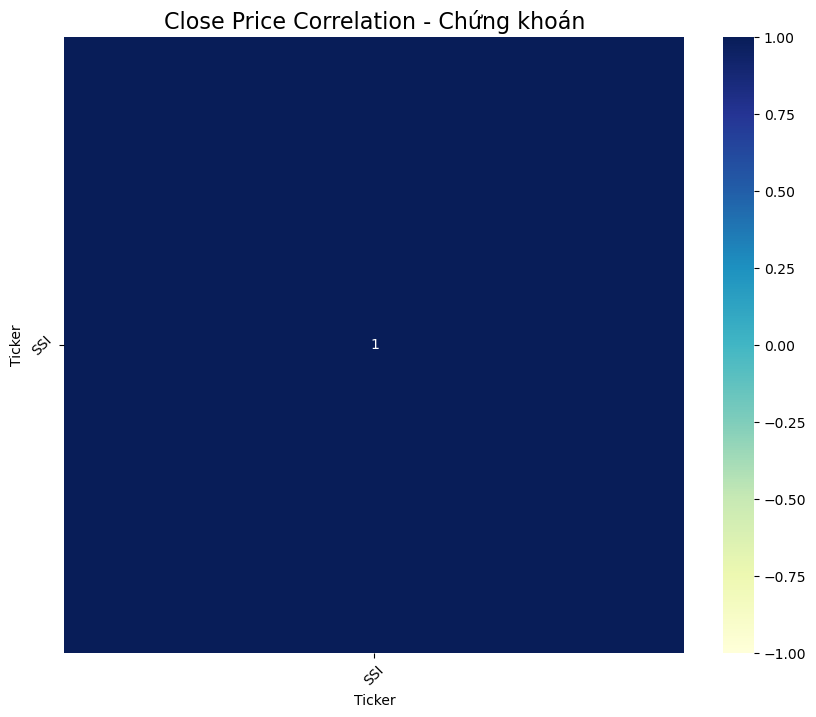

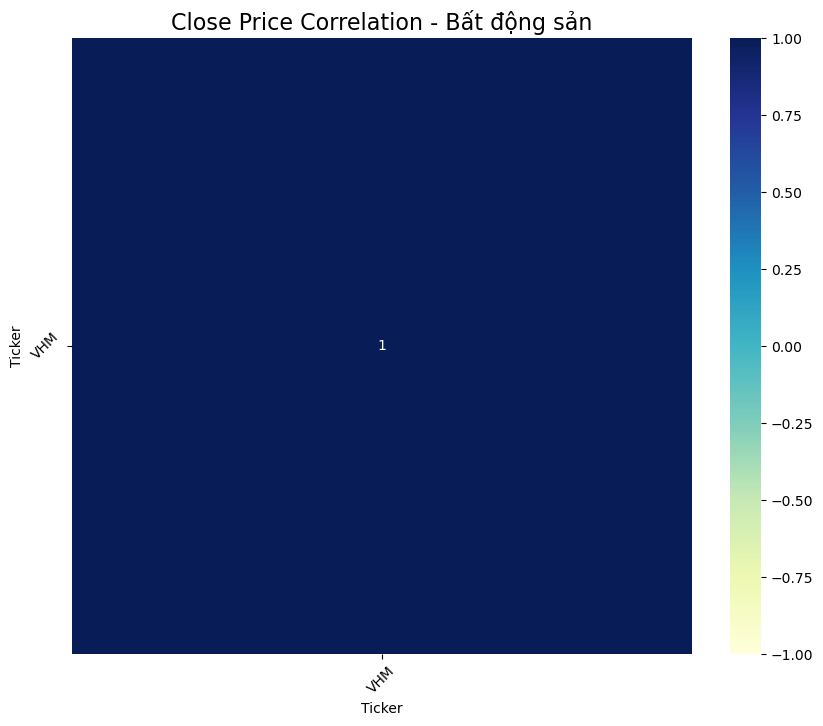

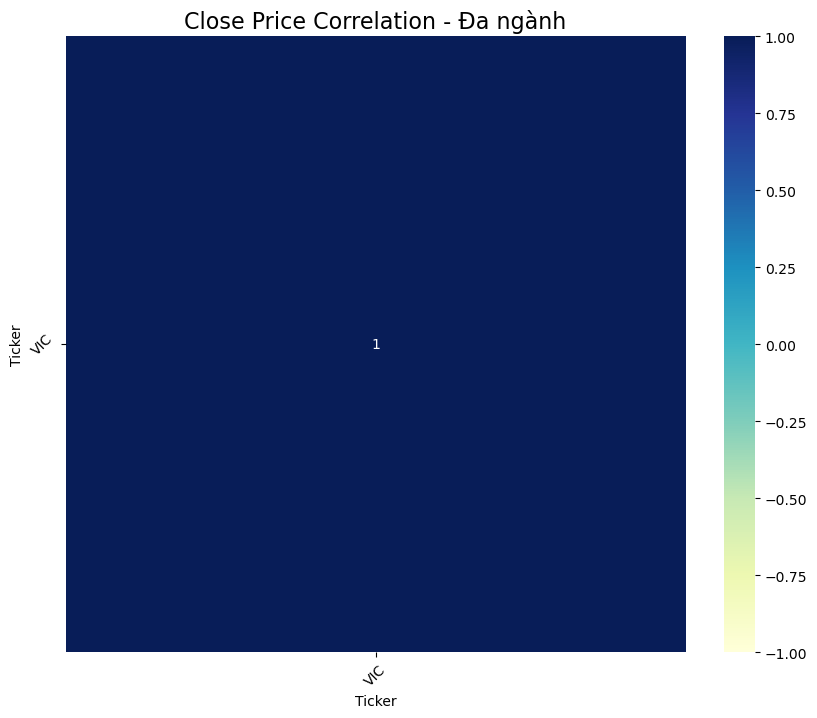

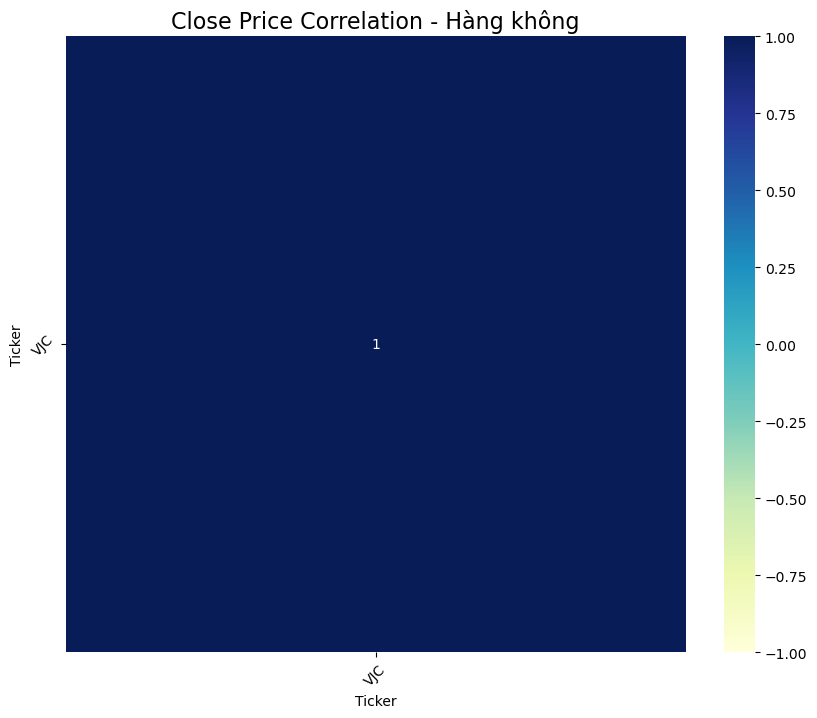

In [33]:
# Trực quan mức tương quan giữa giá đóng các cổ phiếu cùng nhóm ngành:
for industry, data in correlation_results.items():
    correlation_close = data['Close Price Correlation']
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_close, annot=True, cmap='YlGnBu', vmin=-1, vmax=1, cbar=True)
    plt.title(f'Close Price Correlation - {industry}', fontsize=16)
    plt.xticks(rotation=45)
    plt.yticks(rotation=45)
    plt.show()

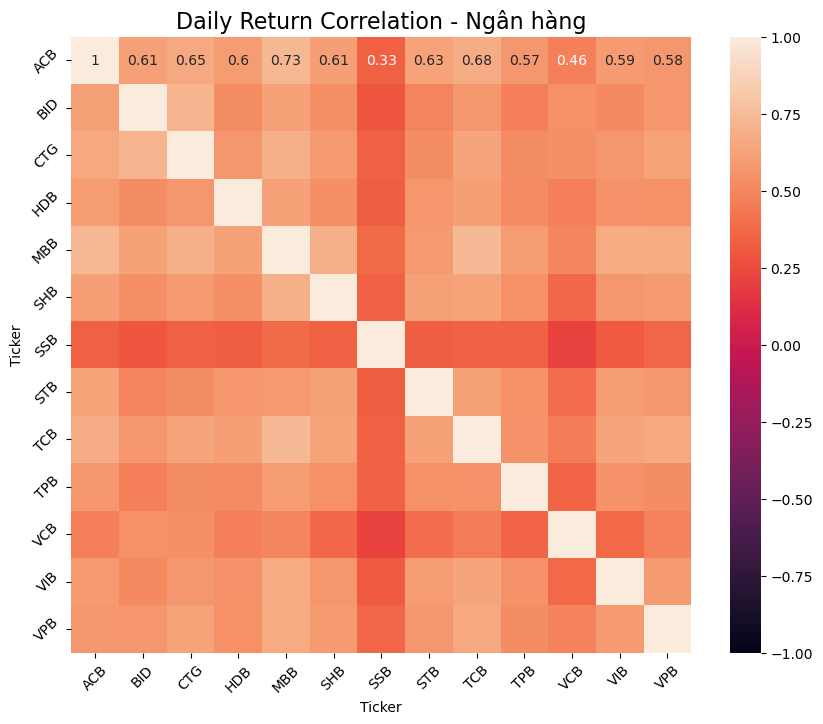

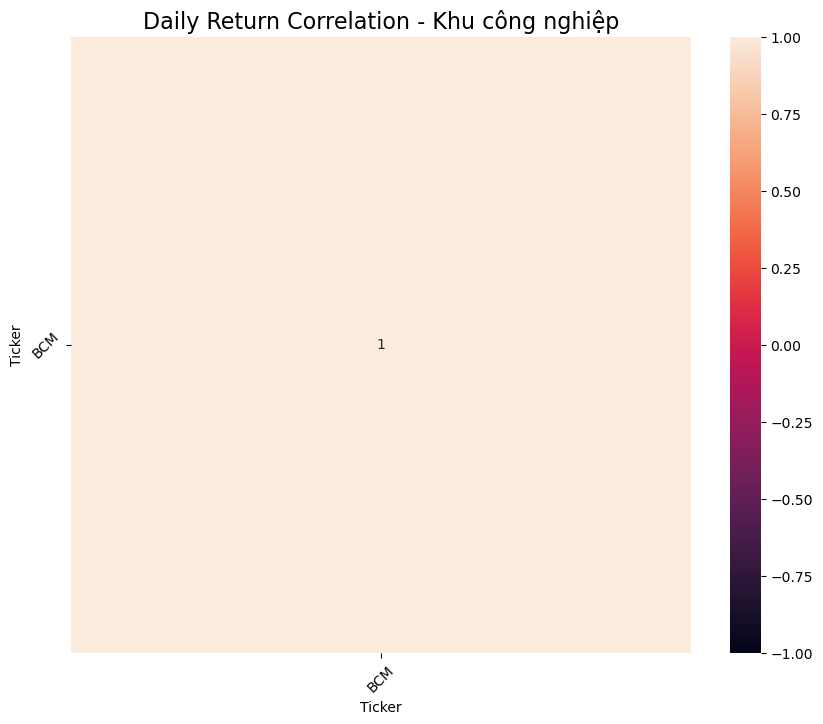

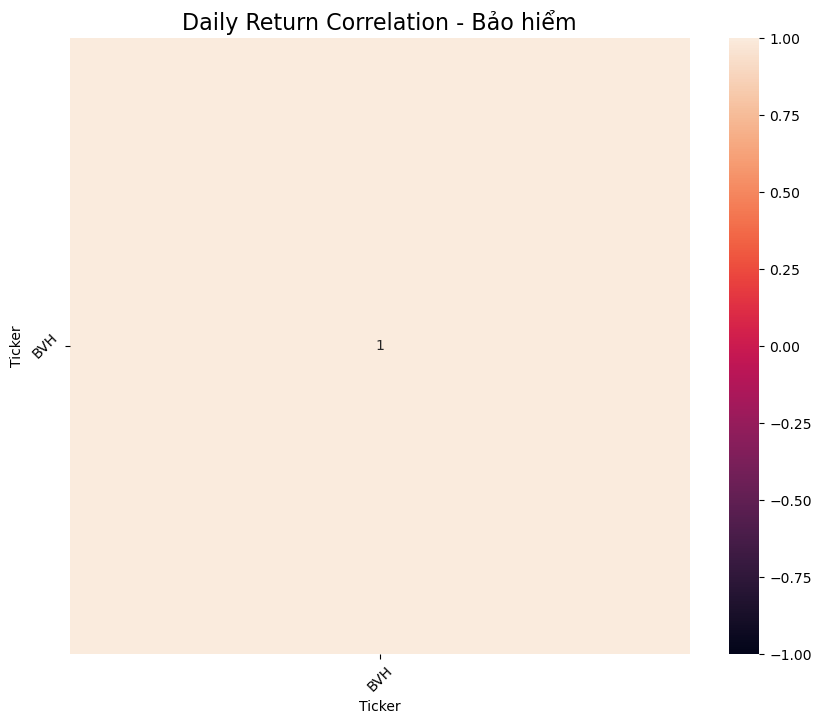

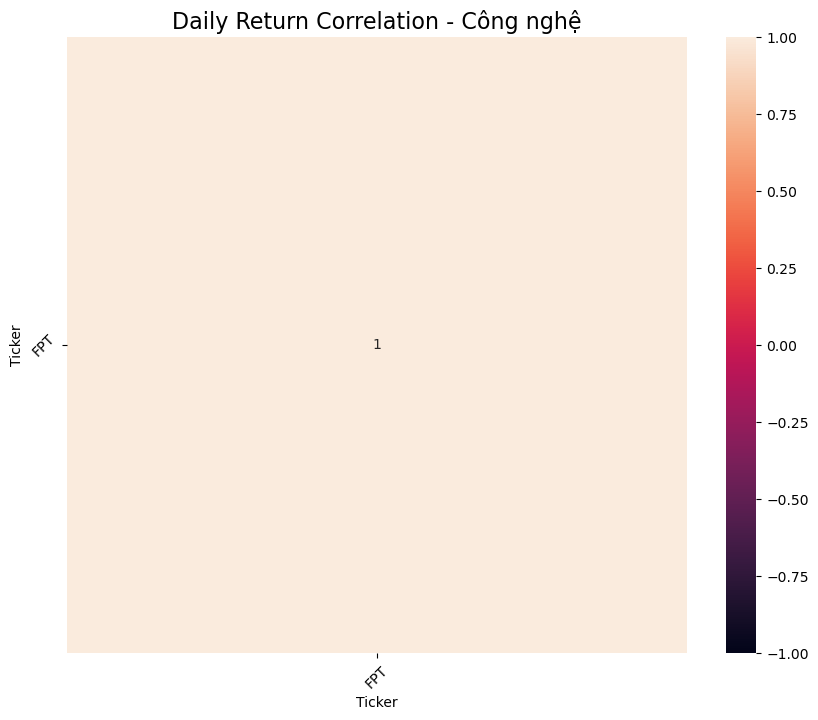

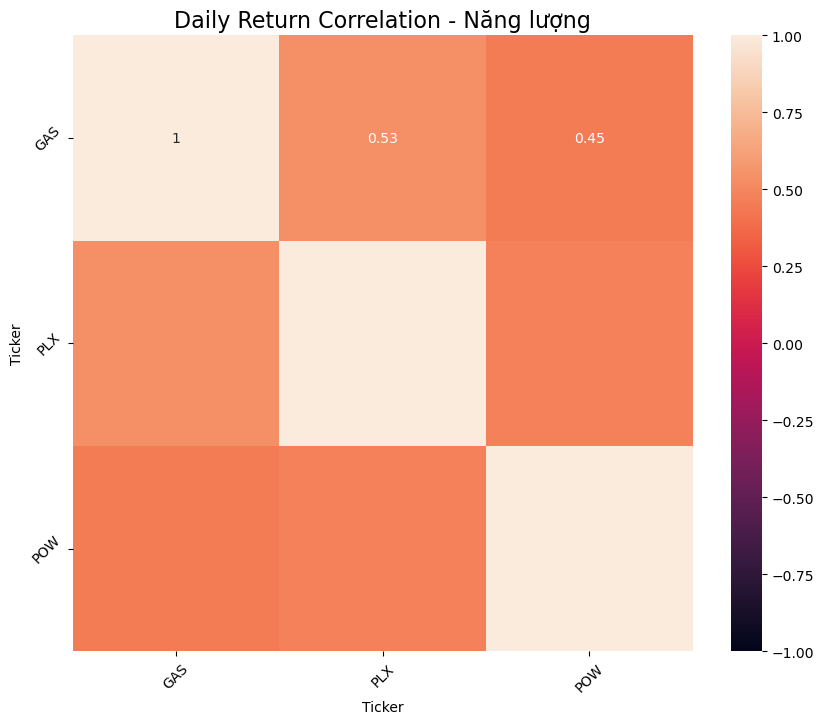

...

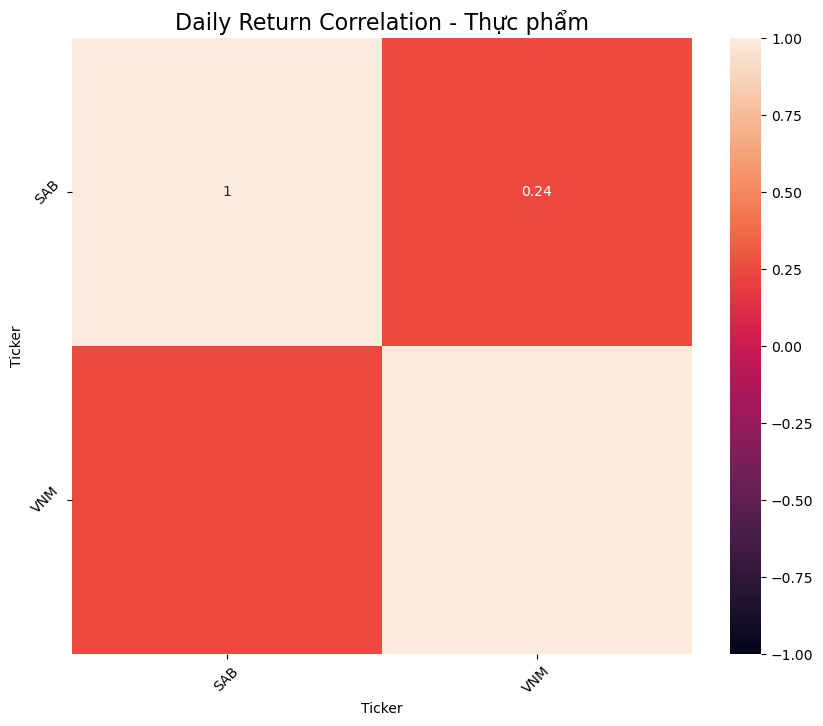

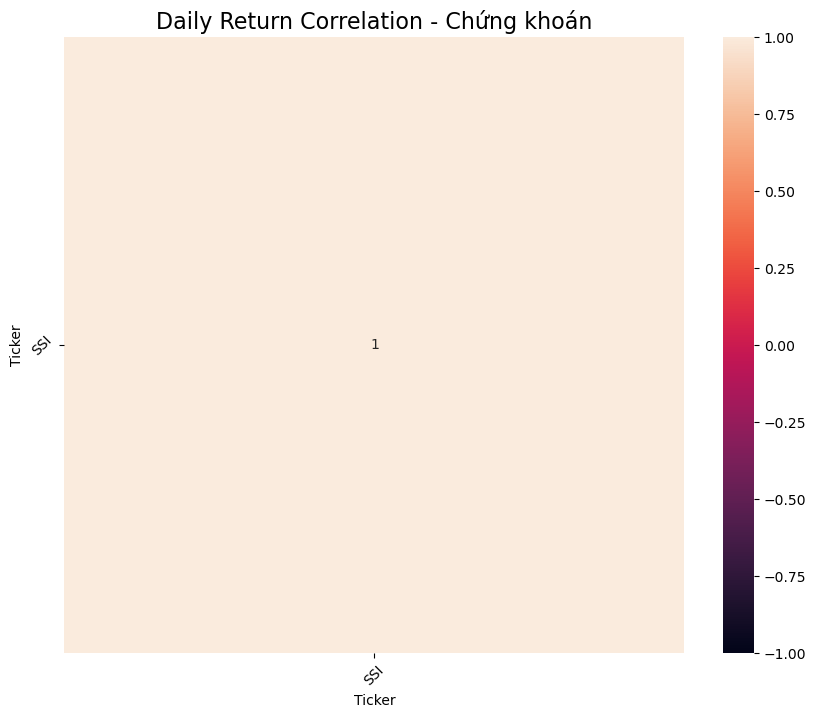

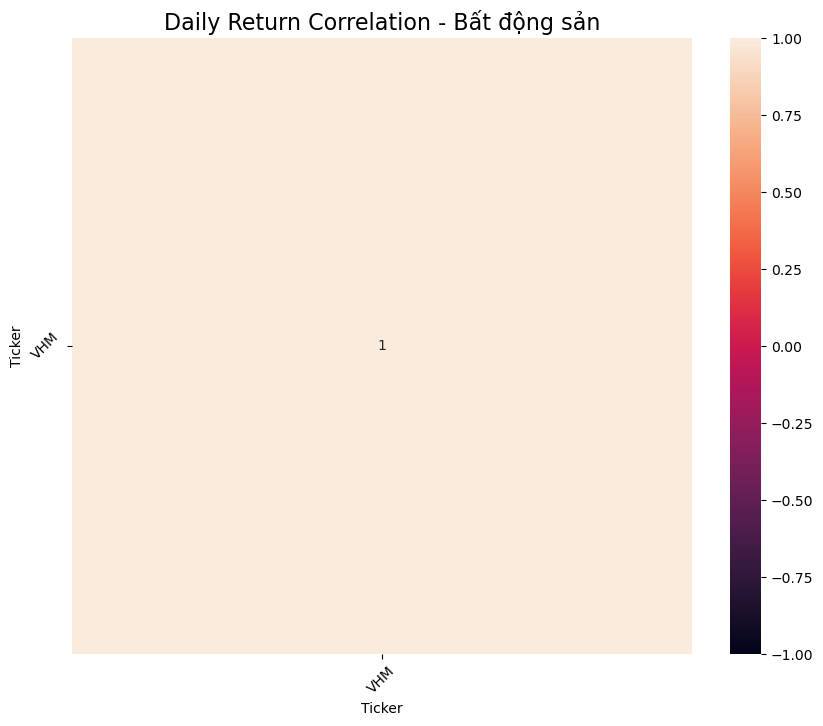

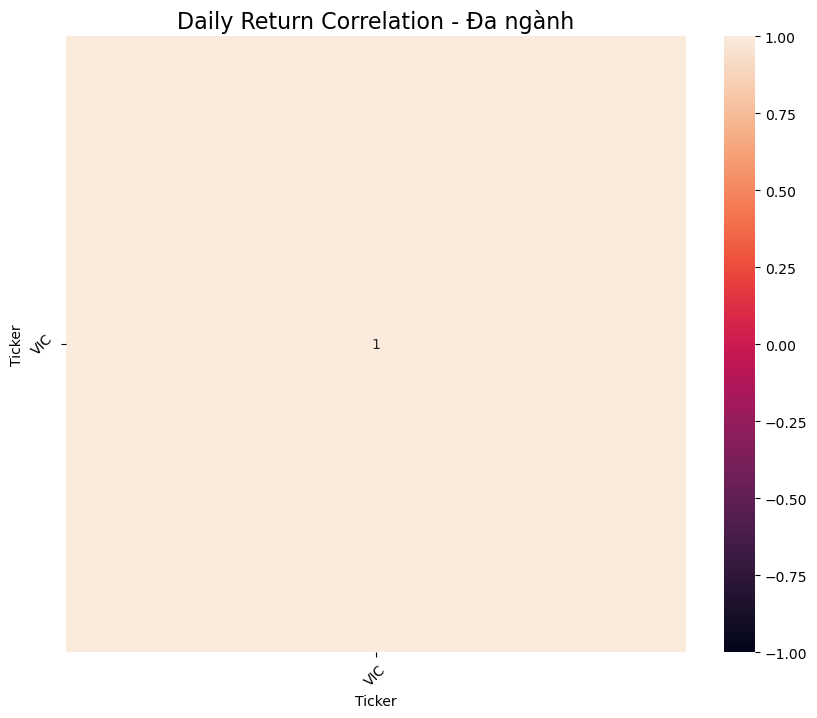

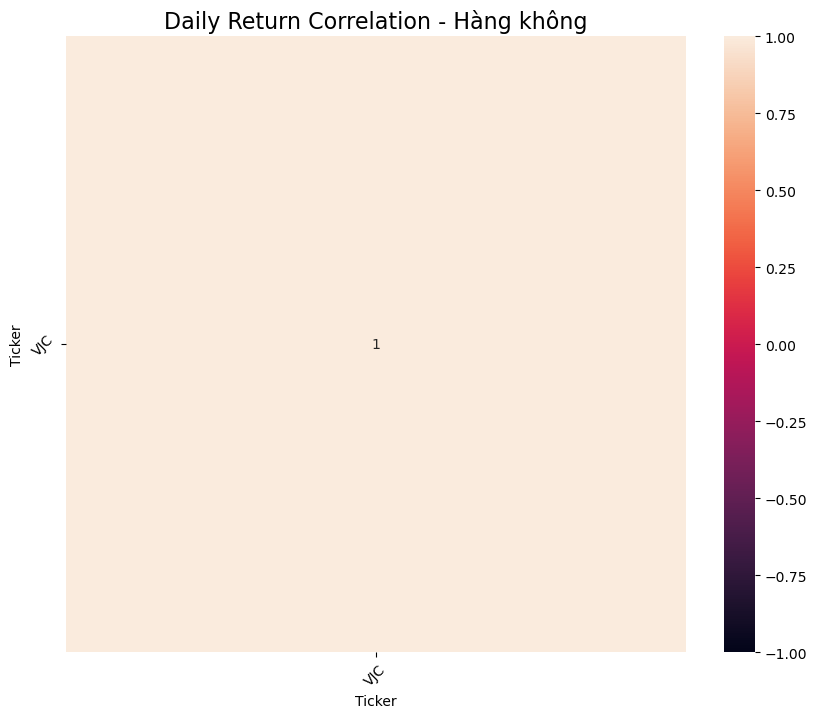

In [34]:
# Vòng lặp để tạo trực quan cho từng ngành
for industry, data in correlation_results.items():
    correlation_daily_return = data['Daily Return Correlation']

    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_daily_return, annot=True, vmin=-1, vmax=1, cbar=True)
    plt.title(f'Daily Return Correlation - {industry}', fontsize=16)
    plt.xticks(rotation=45)
    plt.yticks(rotation=45)
    plt.show()

**Quan sát mối tương quan giữa closing price/daily return giữa tất cả cố phiếu trong VN30**

C:\Users\ACER\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


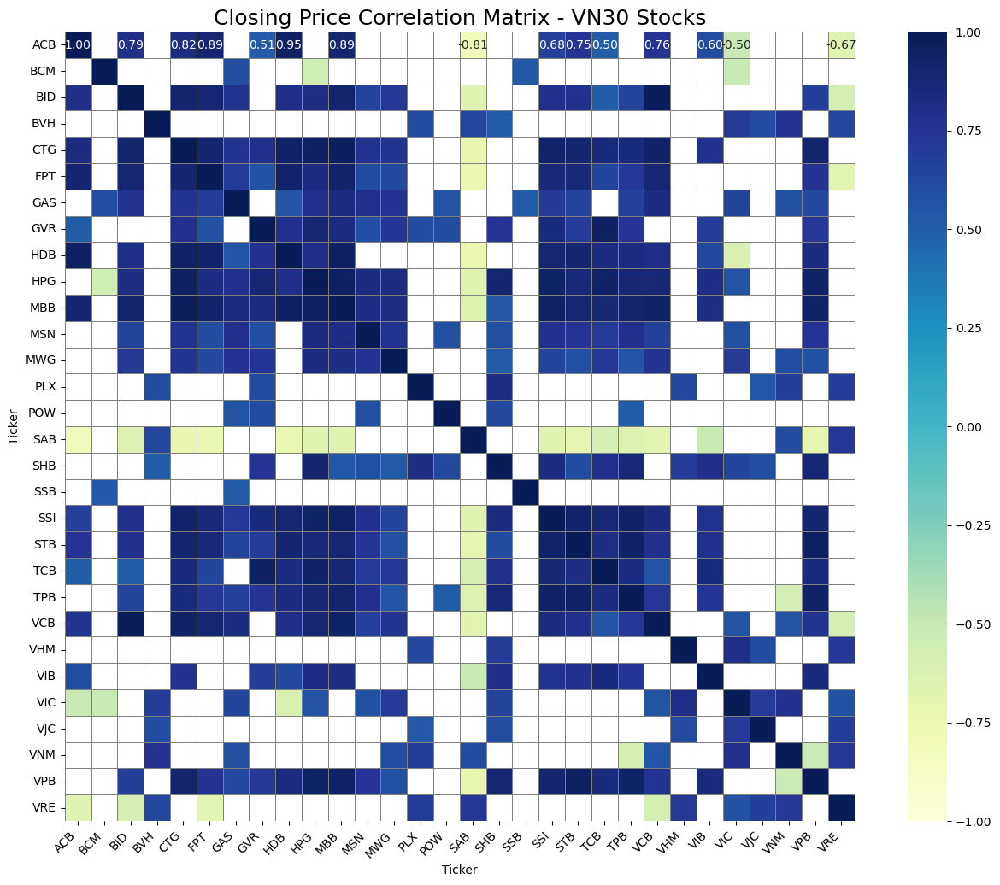

In [35]:
# Closing price
closing_prices = vn30_stocks.pivot(index='Date', columns='Ticker', values='Close')

correlation_close = closing_prices.corr()

threshold = 0.5
correlation_close_filtered = correlation_close[(correlation_close > threshold) | (correlation_close < -threshold)]

plt.figure(figsize=(16, 12))
sns.heatmap(correlation_close_filtered, annot=True, fmt='.2f', cmap='YlGnBu', 
            vmin=-1, vmax=1, cbar=True, square=True, linewidths=0.5, linecolor='gray')
plt.title('Closing Price Correlation Matrix - VN30 Stocks', fontsize=18)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)
plt.show()

C:\Users\ACER\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


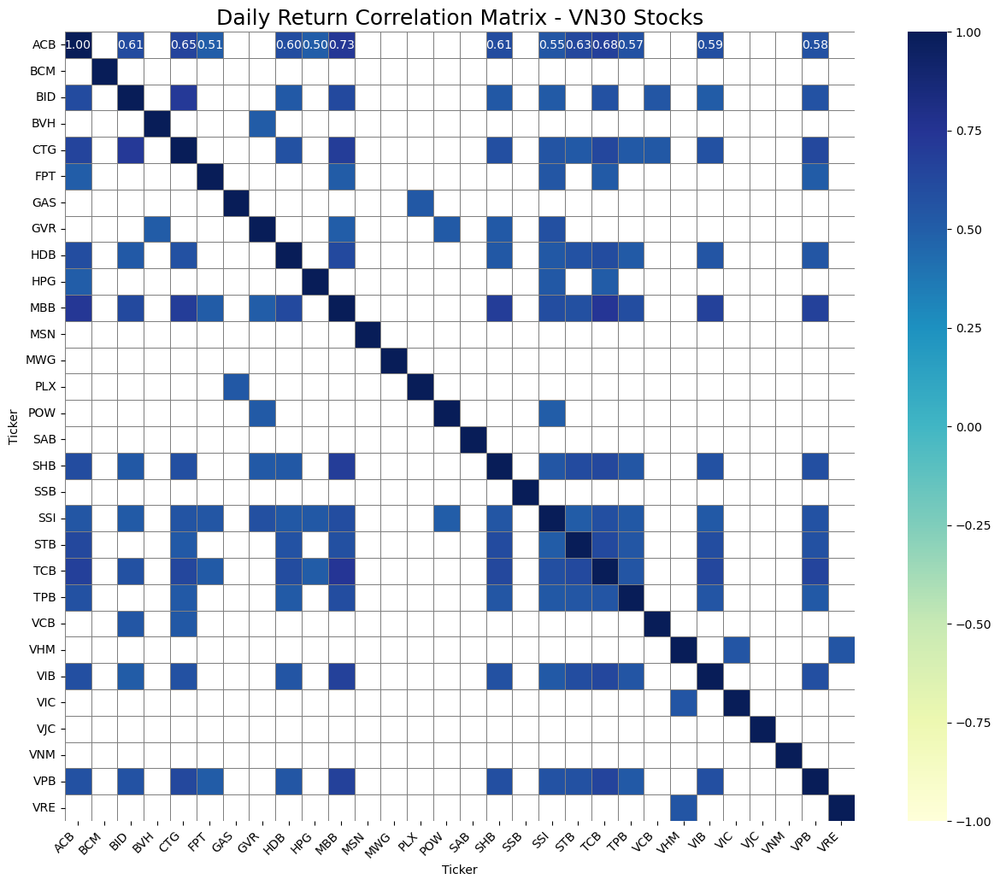

In [36]:
#Daily return
daily_returns = vn30_stocks.pivot(index='Date', columns='Ticker', values='Daily Return')

correlation_matrix = daily_returns.corr()

threshold = 0.5
correlation_filtered = correlation_matrix[(correlation_matrix > threshold) | (correlation_matrix < -threshold)]

plt.figure(figsize=(16, 12))
sns.heatmap(correlation_filtered, annot=True, fmt='.2f', cmap='YlGnBu', vmin=-1, vmax=1, 
            cbar=True, square=True, linewidths=0.5, linecolor='gray')
plt.title('Daily Return Correlation Matrix - VN30 Stocks', fontsize=18)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)
plt.show()

# IV. DATA PROCESSING

In [37]:
#Pivot các cổ phiếu thành columns với close pricea:
vn30_cp = vn30_stocks.pivot_table(index='Date', columns='Ticker', values='Close').reset_index()

In [38]:
vn30_cp

Ticker,Date,ACB,BCM,BID,BVH,CTG,FPT,GAS,GVR,HDB,...,TCB,TPB,VCB,VHM,VIB,VIC,VJC,VNM,VPB,VRE
0,2012-11-01,NaN,NaN,NaN,22.7545,8.6265,4.5979,17.4725,NaN,NaN,...,NaN,NaN,8.2293,NaN,NaN,16.5273,NaN,20.7540,NaN,NaN
1,2012-11-02,NaN,NaN,NaN,21.6855,8.4751,4.3796,17.0744,NaN,NaN,...,NaN,NaN,7.8374,NaN,NaN,16.4214,NaN,19.7735,NaN,NaN
2,2012-11-05,NaN,NaN,NaN,20.6165,8.6265,4.3539,17.2071,NaN,NaN,...,NaN,NaN,7.6237,NaN,NaN,16.5273,NaN,20.5906,NaN,NaN
3,2012-11-06,NaN,NaN,NaN,20.1583,8.5256,4.3025,17.2513,NaN,NaN,...,NaN,NaN,7.4812,NaN,NaN,16.5273,NaN,20.7540,NaN,NaN
4,2012-11-07,NaN,NaN,NaN,21.1510,8.9291,4.3667,17.2513,NaN,NaN,...,NaN,NaN,7.8374,NaN,NaN,16.5273,NaN,20.7540,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2979,2024-10-14,25.95,68.3,49.40,44.0000,36.0500,137.6000,72.9000,36.30,27.00,...,24.35,17.45,91.4000,45.35,19.05,42.1500,107.3,67.2000,20.65,19.15
2980,2024-10-15,25.85,67.8,50.00,43.7000,36.1500,137.0000,72.7000,35.75,27.15,...,24.25,17.45,91.4000,44.65,19.20,41.6500,105.9,66.8000,20.85,18.80
2981,2024-10-16,25.75,67.8,49.85,43.8000,36.3000,136.3000,72.0000,36.10,27.05,...,24.20,17.50,91.5000,45.00,19.15,41.5000,105.8,67.5000,20.85,18.70
2982,2024-10-17,26.15,67.5,50.30,44.0000,36.5500,137.0000,71.5000,36.00,26.60,...,24.35,17.90,92.2000,45.10,19.35,41.5500,105.3,67.6000,20.90,18.75


In [39]:
#Kiểm tra các giá trị null trong df vn30_cp:
vn30_cp_null_counts = vn30_cp.isnull().sum().sort_values(ascending = False)
vn30_cp_null_counts

Ticker
SHB     2228
SSB     2090
ACB     2024
BCM     2024
VIB     2000
GVR     1835
POW     1544
TCB     1387
VHM     1377
TPB     1360
HDB     1292
VRE     1251
VPB     1192
PLX     1110
VJC     1073
SAB     1019
MWG      418
BID      310
FPT        2
HPG        2
GAS        2
BVH        2
STB        1
CTG        1
VIC        0
VNM        0
MSN        0
VCB        0
SSI        0
MBB        0
Date       0
dtype: int64

Về bản chất, các giá trị null xuất hiện là do:

Cổ phiếu chưa được niêm yết: Một số cổ phiếu không có dữ liệu ở các ngày trước khi chúng được niêm yết trên sàn chứng khoán, vì vậy chưa có giá đóng cửa (close price) hay khối lượng giao dịch (stock volume) ghi nhận.

Ngày giao dịch không có thông tin: Có thể có những ngày giao dịch mà không ghi nhận giá đóng cửa và khối lượng giao dịch, có thể do các nguyên nhân như ngày nghỉ giao dịch, cổ phiếu bị tạm ngừng giao dịch vì lý do đặc biệt, hoặc lỗi kỹ thuật trong quá trình thu thập dữ liệu. Những trường hợp này dẫn đến giá trị null cho giá đóng cửa và khối lượng giao dịch trong dữ liệu của các ngày đó.

In [40]:
#Tạo hàm để tìm ra ngày đầu tiên cổ phiếu có giá trị close price xuất hiện trong dataframe:
def first_non_null_date_per_stock(data, date_column='Date'):
    first_dates = {}
    
    for stock in data.columns.drop(date_column):
        first_non_null = data.loc[data[stock].notnull(), date_column].iloc[0]
        first_dates[stock] = first_non_null
    
    return first_dates

first_close_dates = first_non_null_date_per_stock(vn30_cp)

In [41]:
first_close_dates

{'ACB': Timestamp('2020-12-14 00:00:00'),
 'BCM': Timestamp('2020-12-14 00:00:00'),
 'BID': Timestamp('2014-01-24 00:00:00'),
 'BVH': Timestamp('2012-11-01 00:00:00'),
 'CTG': Timestamp('2012-11-01 00:00:00'),
 'FPT': Timestamp('2012-11-01 00:00:00'),
 'GAS': Timestamp('2012-11-01 00:00:00'),
 'GVR': Timestamp('2020-03-17 00:00:00'),
 'HDB': Timestamp('2018-01-05 00:00:00'),
 'HPG': Timestamp('2012-11-01 00:00:00'),
 'MBB': Timestamp('2012-11-01 00:00:00'),
 'MSN': Timestamp('2012-11-01 00:00:00'),
 'MWG': Timestamp('2014-07-14 00:00:00'),
 'PLX': Timestamp('2017-04-21 00:00:00'),
 'POW': Timestamp('2019-01-14 00:00:00'),
 'SAB': Timestamp('2016-12-06 00:00:00'),
 'SHB': Timestamp('2021-10-11 00:00:00'),
 'SSB': Timestamp('2021-03-24 00:00:00'),
 'SSI': Timestamp('2012-11-01 00:00:00'),
 'STB': Timestamp('2012-11-01 00:00:00'),
 'TCB': Timestamp('2018-06-04 00:00:00'),
 'TPB': Timestamp('2018-04-19 00:00:00'),
 'VCB': Timestamp('2012-11-01 00:00:00'),
 'VHM': Timestamp('2018-05-17 00:0

In [42]:
# Tạo 1 hàm để tổng hợp thông tin ngày, giá cổ phiếu và khối lượng trong 1 khung dữ liệu:
def individual_stock(price_df, name):
    
    # Lọc dữ liệu từ ngày đầu tiên có giá trị không phải là NaN trong cột Close của mã cổ phiếu
    start_idx = price_df[name].first_valid_index()
    stock_data = pd.DataFrame({
        'Date': price_df.loc[start_idx:, 'Date'],
        'Close': price_df.loc[start_idx:, name]
    }).reset_index(drop=True)

    return stock_data

In [43]:
individual_stock(vn30_cp, 'FPT')

,Date,Close
0,2012-11-01,4.5979
1,2012-11-02,4.3796
2,2012-11-05,4.3539
3,2012-11-06,4.3025
4,2012-11-07,4.3667
...,...,...
2979,2024-10-14,137.6000
2980,2024-10-15,137.0000
2981,2024-10-16,136.3000
2982,2024-10-17,137.0000


In [44]:
#ví dụ với cổ fpt:
fpt_data = individual_stock(vn30_cp, 'FPT')
fpt_data

,Date,Close
0,2012-11-01,4.5979
1,2012-11-02,4.3796
2,2012-11-05,4.3539
3,2012-11-06,4.3025
4,2012-11-07,4.3667
...,...,...
2979,2024-10-14,137.6000
2980,2024-10-15,137.0000
2981,2024-10-16,136.3000
2982,2024-10-17,137.0000


In [45]:
#ví dụ với cổ acb:
acb_data = individual_stock(vn30_cp,'ACB')
acb_data

,Date,Close
0,2020-12-14,12.6634
1,2020-12-15,12.5736
2,2020-12-16,12.6859
3,2020-12-17,12.7083
4,2020-12-18,12.7532
...,...,...
955,2024-10-14,25.9500
956,2024-10-15,25.8500
957,2024-10-16,25.7500
958,2024-10-17,26.1500


In [46]:
vcb_data = individual_stock(vn30_cp, 'VCB')
vcb_data

,Date,Close
0,2012-11-01,8.2293
1,2012-11-02,7.8374
2,2012-11-05,7.6237
3,2012-11-06,7.4812
4,2012-11-07,7.8374
...,...,...
2979,2024-10-14,91.4000
2980,2024-10-15,91.4000
2981,2024-10-16,91.5000
2982,2024-10-17,92.2000


In [47]:
# Hàm trả về dữ liệu đầu vào/đầu ra (mục tiêu) cho Mô hình AI/ML
# Lưu ý rằng mục tiêu của chúng ta là dự đoán giá cổ phiếu trong tương lai
# Giá cổ phiếu mục tiêu hôm nay sẽ là giá của ngày mai

def trading_window(data):
    data['Target'] = data['Close'].shift(-1)
    
    return data

In [48]:
# Tạo hàm để điền giá trị null của cột Close và Volume 
#bằng cách sử dụng trung bình động 30 ngày trong cùng tháng với giá trị null:
def fill_nulls_with_monthly_ma(df):
    df_filled = df.copy()
    df_filled['Year_Month'] = df_filled['Date'].dt.to_period('M')
    
    def calculate_monthly_ma(group):
        group['MA_Close'] = group['Close'].rolling(window=30, min_periods=1).mean()
        
        group['Close'] = group['Close'].fillna(group['MA_Close'])
        
        return group

    df_filled = df_filled.groupby('Year_Month', group_keys=False).apply(calculate_monthly_ma)
    
    df_filled = df_filled.drop(['Year_Month', 'MA_Close'], axis=1)
    
    return df_filled

**Thử: Thực hiện xử lý dữ liệu để đưa ra dự đoán close price cho cổ phiếu FPT và ACB**

In [49]:
#Điền giá trị null cho fpt data:
full_fpt_data = fill_nulls_with_monthly_ma(fpt_data)
full_fpt_data

,Date,Close
0,2012-11-01,4.5979
1,2012-11-02,4.3796
2,2012-11-05,4.3539
3,2012-11-06,4.3025
4,2012-11-07,4.3667
...,...,...
2979,2024-10-14,137.6000
2980,2024-10-15,137.0000
2981,2024-10-16,136.3000
2982,2024-10-17,137.0000


In [50]:
full_fpt_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2984 entries, 0 to 2983
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    2984 non-null   datetime64[ns]
 1   Close   2984 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 69.9 KB


In [51]:
full_acb_data =  fill_nulls_with_monthly_ma(acb_data)
full_acb_data

,Date,Close
0,2020-12-14,12.6634
1,2020-12-15,12.5736
2,2020-12-16,12.6859
3,2020-12-17,12.7083
4,2020-12-18,12.7532
...,...,...
955,2024-10-14,25.9500
956,2024-10-15,25.8500
957,2024-10-16,25.7500
958,2024-10-17,26.1500


In [52]:
full_vcb_data = fill_nulls_with_monthly_ma(vcb_data)
full_vcb_data

,Date,Close
0,2012-11-01,8.2293
1,2012-11-02,7.8374
2,2012-11-05,7.6237
3,2012-11-06,7.4812
4,2012-11-07,7.8374
...,...,...
2979,2024-10-14,91.4000
2980,2024-10-15,91.4000
2981,2024-10-16,91.5000
2982,2024-10-17,92.2000


# V. BUILDING AND TRAINING A RIDGE LINEAR REGRESSION MODEL: 

Hồi quy Ridge là một phương pháp hồi quy trong đó các tham số của mô hình được điều chỉnh để giảm thiểu hiện tượng overfitting.

Kỹ thuật này sử dụng một thuật toán hồi quy bình phương tối thiểu tuyến tính (tức là tối ưu hóa tổng bình phương của sai số giữa giá trị dự đoán và giá trị thực tế).

Sự điều chỉnh L2 trong hồi quy Ridge có nghĩa là thêm một thành phần vào hàm mất mát (loss function) mà là tổng bình phương của các hệ số hồi quy. Điều này giúp giảm độ lớn của các hệ số, làm cho mô hình ít nhạy cảm hơn với sự biến động của dữ liệu.

**Trước tiên sẽ tạo 1 hàm để tự động việc dự đoán giá đóng của cổ phiếu trong tập test bằng Ridge Regression**

In [53]:
# # Bước 1: Chuẩn bị dữ liệu
# data = full_fpt_data[['Date', 'Close']]
# data.set_index('Date', inplace=True)
# dataset = data['Close'].values

# # Bước 2: Tạo tập dữ liệu huấn luyện, validate và test
# train_split = 0.7
# val_split = 0.15
# window_size = 60
# alpha_range = (1, 10)
# alpha_steps = 100

# train_size = int(len(dataset) * train_split)
# val_size = int(len(dataset) * val_split)
# test_size = len(dataset) - train_size - val_size

# # Bước 3: Chuẩn hóa dữ liệu
# scaler = MinMaxScaler(feature_range=(0, 1))
# scaled_data = scaler.fit_transform(dataset.reshape(-1, 1))

# train_data = scaled_data[:train_size]
# val_data = scaled_data[train_size:train_size + val_size]
# test_data = scaled_data[train_size + val_size:]

# # Bước 4: Tạo dữ liệu huấn luyện cho Ridge Regression
# x_train, y_train = [], []
# for i in range(window_size, len(train_data)):
#     x_train.append(train_data[i - window_size:i, 0])
#     y_train.append(train_data[i, 0])

# x_train, y_train = np.array(x_train), np.array(y_train)

# # Bước 5: Tìm alpha tốt nhất bằng GridSearchCV
# alpha_values = np.linspace(alpha_range[0], alpha_range[1], alpha_steps)
# ridge = Ridge()
# param_grid = {'alpha': alpha_values}

# grid_search = GridSearchCV(estimator=ridge, param_grid=param_grid,
#                            scoring='neg_mean_squared_error', cv=5, n_jobs=-1)
# grid_search.fit(x_train, y_train)

# best_alpha = grid_search.best_params_['alpha']
# print(f"Alpha tốt nhất: {best_alpha}")

# # Bước 6: Tạo và huấn luyện mô hình Ridge Regression
# ridge_model = Ridge(alpha=best_alpha)
# ridge_model.fit(x_train, y_train)

# # Bước 7: Chuẩn bị dữ liệu cho validate
# x_val, y_val = [], []
# for i in range(window_size, len(val_data)):
#     x_val.append(val_data[i - window_size:i, 0])
#     y_val.append(val_data[i, 0])

# x_val, y_val = np.array(x_val), np.array(y_val)

# # Bước 8: Dự đoán cho validate
# val_predictions = ridge_model.predict(x_val)
# val_predictions_inverse = scaler.inverse_transform(val_predictions.reshape(-1, 1))
# y_val_inverse = scaler.inverse_transform(y_val.reshape(-1, 1))

# # Tính toán chỉ số đánh giá cho validate
# val_mse = mean_squared_error(y_val_inverse, val_predictions_inverse)
# val_rmse = np.sqrt(val_mse)
# val_mae = mean_absolute_error(y_val_inverse, val_predictions_inverse)
# print(f"Validate MSE: {val_mse:.4f}, RMSE: {val_rmse:.4f}, MAE: {val_mae:.4f}")

# # Bước 9: Chuẩn bị dữ liệu cho test
# x_test, y_test = [], []
# for i in range(window_size, len(test_data)):
#     x_test.append(test_data[i - window_size:i, 0])
#     y_test.append(test_data[i, 0])

# x_test, y_test = np.array(x_test), np.array(y_test)

# # Bước 10: Dự đoán cho test
# test_predictions = ridge_model.predict(x_test)
# test_predictions_inverse = scaler.inverse_transform(test_predictions.reshape(-1, 1))
# y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))

# # Tính toán chỉ số đánh giá cho test
# test_mse = mean_squared_error(y_test_inverse, test_predictions_inverse)
# test_rmse = np.sqrt(test_mse)
# test_mae = mean_absolute_error(y_test_inverse, test_predictions_inverse)
# print(f"Test MSE: {test_mse:.4f}, RMSE: {test_rmse:.4f}, MAE: {test_mae:.4f}")

# # Bước 11: Tạo DataFrame cho dữ liệu validate
# val_dates = data.index[train_size:train_size + val_size][window_size:]
# comparison_val_df = pd.DataFrame({
#     'Date': val_dates,
#     'Real Prices': y_val_inverse.flatten()[:len(val_dates)],
#     'Validate Predictions': val_predictions_inverse.flatten()
# })

# # Bước 12: Tạo DataFrame cho dữ liệu test
# test_dates = data.index[train_size + val_size:][window_size:]
# comparison_test_df = pd.DataFrame({
#     'Date': test_dates,
#     'Real Prices': y_test_inverse.flatten()[:len(test_dates)],
#     'Test Predictions': test_predictions_inverse.flatten()
# })

# # Bước 13: Trực quan hóa dữ liệu validate
# plt.figure(figsize=(16, 8))
# plt.title('Stock Prediction - Validation Set')
# plt.xlabel('Date')
# plt.ylabel('Close Price')
# plt.plot(comparison_val_df['Date'], comparison_val_df['Real Prices'], label='Real Prices Validate', color='blue', linestyle='--')
# plt.plot(comparison_val_df['Date'], comparison_val_df['Validate Predictions'], label='Validate Predictions', color='orange')
# plt.legend(['Real Prices Validate', 'Validate Predictions'], loc='lower right')
# plt.show()

# # Trực quan hóa dữ liệu test
# plt.figure(figsize=(16, 8))
# plt.title('Stock Prediction - Test Set')
# plt.xlabel('Date')
# plt.ylabel('Close Price')
# plt.plot(comparison_test_df['Date'], comparison_test_df['Real Prices'], label='Real Prices Test', color='green', linestyle='--')
# plt.plot(comparison_test_df['Date'], comparison_test_df['Test Predictions'], label='Test Predictions', color='red')
# plt.legend(['Real Prices Test', 'Test Predictions'], loc='lower right')
# plt.show()

In [54]:
def ridge_prediction(stock_data, train_split=0.95, window_size=30, alpha_range=(1, 10), alpha_steps=100):
    # Bước 1: Chuẩn bị dữ liệu
    data = stock_data[['Date', 'Close']]
    data.set_index('Date', inplace=True)
    dataset = data['Close'].values

    # Bước 2: Tạo tập dữ liệu huấn luyện
    training_data_len = int(np.ceil(len(dataset) * train_split))

    # Bước 3: Chuẩn hóa dữ liệu
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset.reshape(-1, 1))

    # Tạo tập huấn luyện
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []

    # Sử dụng cửa sổ để dự đoán ngày tiếp theo
    for i in range(window_size, len(train_data)):
        x_train.append(train_data[i - window_size:i, 0])
        y_train.append(train_data[i, 0])

    x_train, y_train = np.array(x_train), np.array(y_train)

    # Bước 4: Tìm alpha tốt nhất bằng GridSearchCV
    alpha_values = np.linspace(alpha_range[0], alpha_range[1], alpha_steps)
    ridge = Ridge()
    param_grid = {'alpha': alpha_values}

    grid_search = GridSearchCV(estimator=ridge, param_grid=param_grid,
                               scoring='neg_mean_squared_error', cv=5, n_jobs=-1)
    grid_search.fit(x_train, y_train)

    best_alpha = grid_search.best_params_['alpha']
    print(f"Alpha tốt nhất: {best_alpha}")
    print(f"Giá trị MSE tối thiểu: {-grid_search.best_score_}")

    # Tạo và huấn luyện mô hình Ridge Regression với alpha tốt nhất
    ridge_model = Ridge(alpha=best_alpha)
    ridge_model.fit(x_train, y_train)

    # Bước 5: Chuẩn bị dữ liệu kiểm tra
    test_data = scaled_data[training_data_len - window_size:, :]
    x_test = []
    y_test = dataset[training_data_len:]

    for i in range(window_size, len(test_data)):
        x_test.append(test_data[i - window_size:i, 0])

    x_test = np.array(x_test)

    # Bước 6: Dự đoán giá Close với dữ liệu kiểm tra
    predictions = ridge_model.predict(x_test)
    predictions = predictions.reshape(-1, 1)

    # Inverse transform để đưa về giá trị gốc
    predicted_prices = scaler.inverse_transform(predictions)
    real_prices = y_test.reshape(-1, 1)

    # Tính toán lỗi (MSE)
    mse = mean_squared_error(real_prices, predicted_prices)
    print(f"Mean Squared Error: {mse}")

    # Bước 7: Tạo DataFrame để so sánh giữa giá Close và giá dự đoán
    comparison_df = pd.DataFrame(data={
        'Date': data.index[training_data_len:],  
        'Close': real_prices.flatten(),
        'Predictions': predicted_prices.flatten()
    })

    # Bước 8: Visualize kết quả dự đoán
    train = data[:training_data_len]
    valid = data[training_data_len:]
    valid['Predictions'] = predicted_prices

    plt.figure(figsize=(16, 8))
    plt.title('Model Ridge Regression with Optimal Alpha')
    plt.xlabel('Date')
    plt.ylabel('Close Price')
    plt.plot(train['Close'], label='Train')
    plt.plot(valid[['Close']], label='Real Prices', color='blue')
    plt.plot(valid[['Predictions']], label='Predictions', color='red')
    plt.legend(['Train', 'Real Prices', 'Predictions'], loc='lower right')
    plt.show()

    return comparison_df

Hàm ridge_prediction được thiết kế để dự đoán giá cổ phiếu trong tập test bằng mô hình hồi quy Ridge. Đầu tiên, hàm nhận vào một DataFrame stock_data chứa thông tin về giá cổ phiếu, cùng với các tham số tùy chọn như tỷ lệ chia dữ liệu huấn luyện (train_split), kích thước cửa sổ (window_size), khoảng giá trị alpha để tìm kiếm tối ưu (alpha_range), và số bước trong quá trình tìm kiếm (alpha_steps).

Bước đầu tiên là chuẩn bị dữ liệu bằng cách trích xuất cột 'Date' và 'Close', sau đó đặt cột 'Date' làm chỉ số và chuyển đổi giá trị của cột 'Close' thành một mảng numpy. Xong, hàm tính toán độ dài dữ liệu huấn luyện dựa trên tỷ lệ đã chỉ định và chuẩn hóa dữ liệu để đưa về khoảng giá trị từ 0 đến 1.

Sau đó, hàm tạo ra dữ liệu huấn luyện bằng cách sử dụng kích thước cửa sổ đã xác định để lấy giá trị từ dữ liệu đã chuẩn hóa. Cụ thể, một vòng lặp được sử dụng để tạo ra các mảng x_train và y_train, trong đó x_train chứa các giá trị từ trước dựa trên kích thước cửa sổ, và y_train là giá trị cần dự đoán.

Tiếp theo, hàm tìm kiếm giá trị alpha tốt nhất cho mô hình hồi quy Ridge thông qua GridSearchCV với thang giá trị alpha đã chỉ định. Sau khi xác định được alpha tối ưu, hàm sẽ tạo và huấn luyện mô hình hồi quy Ridge với giá trị đó. Sau khi hoàn thành, dữ liệu kiểm tra được chuẩn bị tương tự như dữ liệu huấn luyện và việc dự đoán được thực hiện trên tập kiểm tra. Sau khi có kết quả dự đoán, hàm tính toán sai số bình quân (MSE) giữa giá thực tế và giá dự đoán, đồng thời đưa ra giá trị này để đánh giá hiệu suất của mô hình.

Cuối cùng, hàm tạo một DataFrame so sánh giữa giá thực tế và giá dự đoán, đồng thời trực quan hóa kết quả dự đoán thông qua biểu đồ, hiển thị giá trị huấn luyện, giá thực tế và giá dự đoán.

Alpha tốt nhất: 1.0
Giá trị MSE tối thiểu: 8.524907034999727e-05
Mean Squared Error: 10.916219165610446


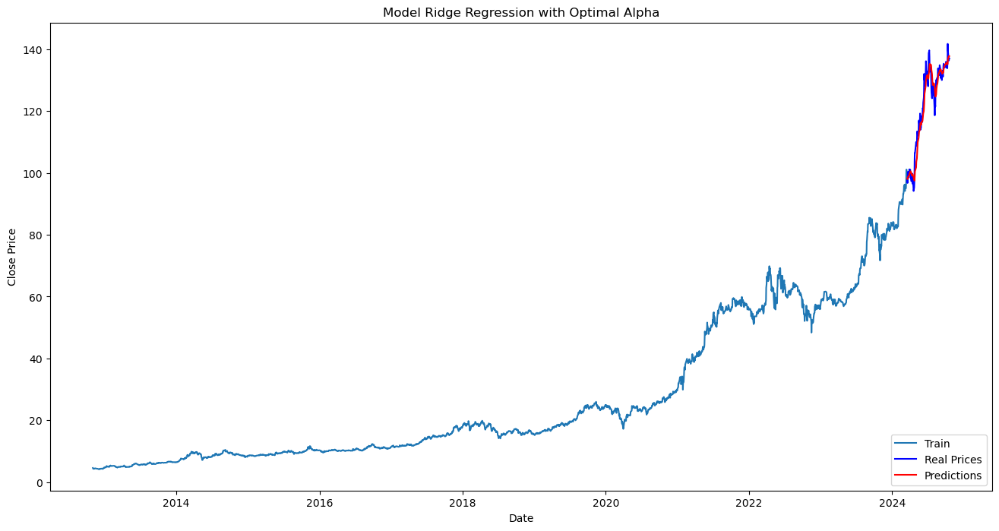

,Date,Close,Predictions
0,2024-03-18,97.5868,98.151658
1,2024-03-19,96.7232,98.134123
2,2024-03-20,98.8822,97.964277
3,2024-03-21,100.3503,98.261839
4,2024-03-22,99.2276,98.780767
...,...,...,...
144,2024-10-14,137.6000,137.417773
145,2024-10-15,137.0000,137.606890
146,2024-10-16,136.3000,137.672064
147,2024-10-17,137.0000,137.602927


In [55]:
ridge_prediction(stock_data = full_fpt_data)

Alpha tốt nhất: 1.0
Giá trị MSE tối thiểu: 0.0007859098639001145
Mean Squared Error: 0.10737830018739729


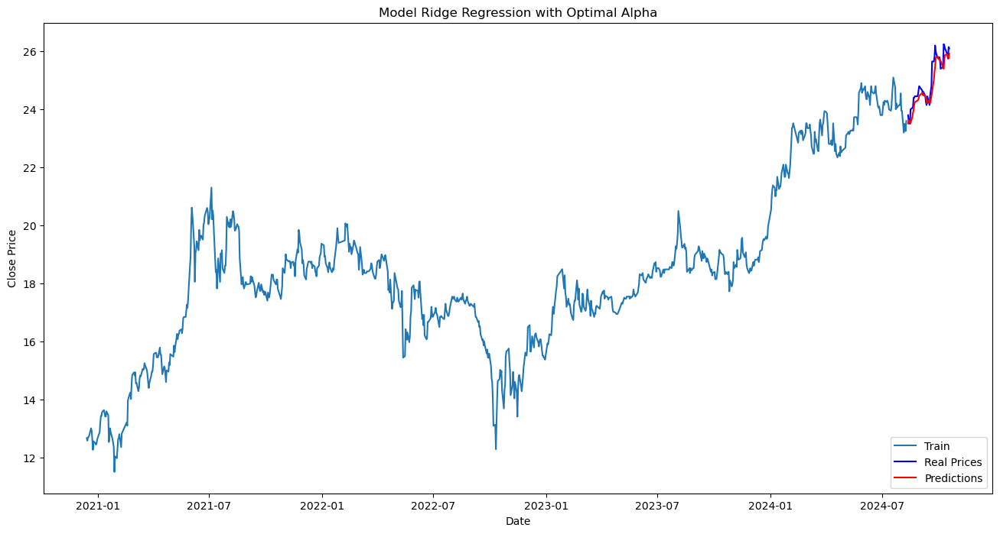

,Date,Close,Predictions
0,2024-08-12,23.80,23.509503
1,2024-08-13,23.60,23.631136
2,2024-08-14,23.55,23.584107
3,2024-08-15,23.50,23.549708
4,2024-08-16,24.00,23.524243
5,2024-08-19,24.05,23.746569
6,2024-08-20,24.10,23.882511
7,2024-08-21,24.40,23.978034
8,2024-08-22,24.40,24.162498
9,2024-08-23,24.45,24.245267


In [56]:
ridge_prediction(full_acb_data)

Alpha tốt nhất: 1.0
Giá trị MSE tối thiểu: 0.00015340240554302355
Mean Squared Error: 1.0572606646686087


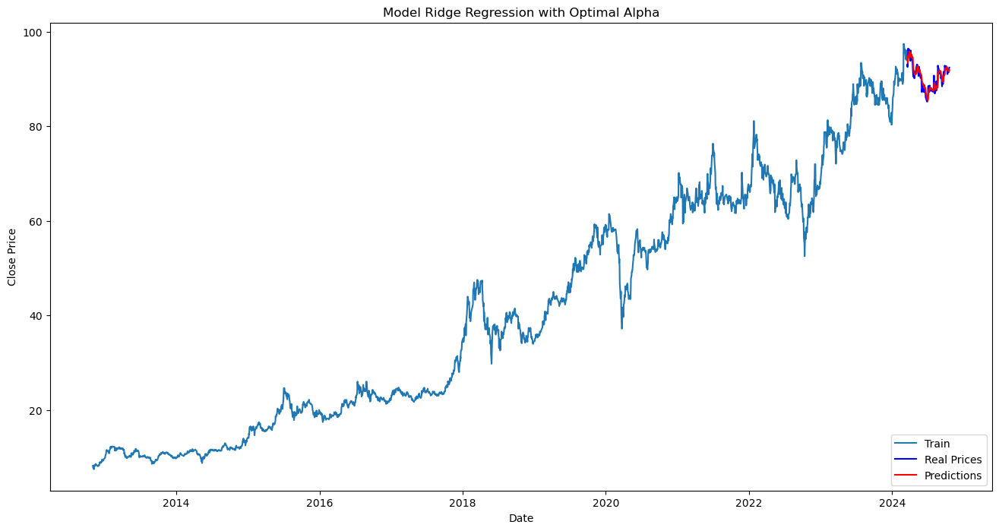

,Date,Close,Predictions
0,2024-03-18,93.0,94.820435
1,2024-03-19,92.5,94.165481
2,2024-03-20,93.2,93.600893
3,2024-03-21,95.2,93.452643
4,2024-03-22,96.4,94.075841
...,...,...,...
144,2024-10-14,91.4,91.727340
145,2024-10-15,91.4,91.624647
146,2024-10-16,91.5,91.574110
147,2024-10-17,92.2,91.585323


In [57]:
ridge_prediction(full_vcb_data)

# VI. BUILDING AND TRAINING A LSTM MODEL: 

Khi áp dụng LSTM trong dự đoán giá chứng khoán, mô hình này có thể khai thác các xu hướng và mẫu biến động giá trong lịch sử để dự đoán giá trong tương lai. Một trong những ưu điểm lớn của LSTM là khả năng xử lý các chuỗi thời gian không tuyến tính, cho phép mô hình nhận diện được các mối quan hệ phức tạp giữa các giá trị trong lịch sử và giá trị dự đoán.

Trong quá trình huấn luyện, dữ liệu lịch sử của giá cổ phiếu được chia thành các chuỗi con với một kích thước cửa sổ nhất định, cho phép LSTM học được các đặc điểm quan trọng từ các giai đoạn trước. Các yếu tố như tin tức tài chính, sự kiện kinh tế, và tâm lý thị trường cũng có thể được đưa vào mô hình như các biến đầu vào bổ sung, giúp tăng cường khả năng dự đoán.

Một khi mô hình LSTM đã được huấn luyện, nó có thể đưa ra các dự đoán về giá cổ phiếu trong tương lai, từ đó hỗ trợ các nhà đầu tư trong việc đưa ra quyết định đầu tư chính xác hơn. Việc dự đoán giá chứng khoán không chỉ giúp nhận diện các cơ hội đầu tư mà còn có thể giúp quản lý rủi ro hiệu quả hơn, từ đó tối ưu hóa lợi nhuận trong các danh mục đầu tư.

**Thực hiện việc tạo 1 hàm để có thể dự đoán giá đóng của cổ phiếu trong tập test**

In [58]:
# def preprocess_lstm(sequence, n_steps, n_features):
#     X, y = list(), list()
#     for i in range(len(sequence)):
#         end_ix = i + n_steps
#         if end_ix >= len(sequence):
#             break
#         seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
#         X.append(seq_x)
#         y.append(seq_y)
#     X, y = np.array(X), np.array(y)
#     X = X.reshape((X.shape[0], X.shape[1], n_features))
#     return X, y

# df_close_shift = full_fpt_data[['Close']].copy()
# scaler = MinMaxScaler(feature_range=(0, 1))
# df_close_shift['Close'] = scaler.fit_transform(df_close_shift)

# nb_days = 60
# n_features = 1
# X, y = preprocess_lstm(df_close_shift['Close'].values, nb_days, n_features)

# split_idx = int(0.95 * len(X))
# X_train, y_train = X[:split_idx], y[:split_idx]
# X_test, y_test = X[split_idx:], y[split_idx:]

# def vanilla_LSTM():
#     model = Sequential()    
#     model.add(LSTM(units=50, input_shape=(nb_days, n_features)))
#     model.add(Dense(1))
#     return model

# model = vanilla_LSTM()
# model.summary()
# model.compile(optimizer='adam', loss='mean_squared_error', metrics=[tf.keras.metrics.MeanAbsoluteError()])

# model.fit(X_train, y_train, epochs=50, batch_size=32)

# print("Evaluate on test data")
# results = model.evaluate(X_test, y_test, batch_size=32)
# print("Test MSE:", results[0])
# print("Test MAE:", results[1])

# y_pred = model.predict(X_test)
# y_pred_inv = scaler.inverse_transform(y_pred)
# y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

# test_dates = full_fpt_data.index[-len(y_test):]

# comparison_df = pd.DataFrame({
#     'Date': test_dates,
#     'Actual_Close': y_test_inv.flatten(),
#     'Predicted_Close': y_pred_inv.flatten()
# })

# # Display the comparison DataFrame
# print(comparison_df)

# # Plot actual vs predicted
# plt.figure(figsize=(10,6))
# plt.plot(comparison_df['Date'], comparison_df['Actual_Close'], 'b', label='Actual prices')
# plt.plot(comparison_df['Date'], comparison_df['Predicted_Close'], 'orange', label='Predicted prices')
# plt.xlabel('Date')
# plt.ylabel('Closing Prices')
# plt.title('Stock Price Prediction using LSTM model')
# plt.legend()
# plt.xticks(rotation=45)
# plt.show()

In [59]:
import random
import os

def set_seeds(seed=42):
    np.random.seed(seed)
    tf.random.set_seed(seed)
    random.seed(seed)

In [60]:
def lstm_prediction(df, epochs=30, window_size = 30, batch_size=16):
    set_seeds(42)  

    # Bước 1: Kiểm tra và chuẩn bị dữ liệu
    df = df[['Date', 'Close']].copy()  
    df['Date'] = pd.to_datetime(df['Date'])  
    df.set_index('Date', inplace=True) 

    # Bước 2: Chuẩn hóa dữ liệu
    scaler = MinMaxScaler(feature_range=(0, 1))
    df['Close'] = scaler.fit_transform(df[['Close']])

    # Bước 3: Chuẩn bị dữ liệu cho mô hình LSTM
    X, y = [], []
    for i in range(window_size, len(df)):
        X.append(df['Close'].values[i - window_size:i])
        y.append(df['Close'].values[i])
    X, y = np.array(X), np.array(y)
    X = X.reshape((X.shape[0], X.shape[1], 1))

    # Bước 4: Chia dữ liệu thành train và test:
    train_size = int(len(X) * 0.95)
    X_train, y_train = X[:train_size], y[:train_size]
    X_test, y_test = X[train_size:], y[train_size:]

    # Bước 5: Build mô hình LSTM
    model = Sequential()
    model.add(LSTM(units=128, return_sequences=True, input_shape=(window_size, 1)))
    model.add(LSTM(units=64))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    
    # Bước 6: Huấn luyện mô hình không dùng validation
    history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size)

    # Bước 7: Dự đoán và trả đúng giá trị dữ liệu cho tập test
    y_test_pred = model.predict(X_test)
    y_test_pred_inv = scaler.inverse_transform(y_test_pred)
    y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

    # Bước 8: Tạo DataFrame để so sánh giá thực tế và giá dự đoán cho test
    test_dates = df.index[window_size:][train_size:]
    
    comparison_test_df = pd.DataFrame({
        'Date': test_dates,
        'Actual_Close': y_test_inv.flatten(),
        'Predicted_Close': y_test_pred_inv.flatten()
    })

    # Bước 9: Tính toán các chỉ số đánh giá cho hoạt động dự đoán trên tập test
    mse_test = mean_squared_error(comparison_test_df['Actual_Close'], comparison_test_df['Predicted_Close'])
    rmse_test = np.sqrt(mse_test)
    mae_test = mean_absolute_error(comparison_test_df['Actual_Close'], comparison_test_df['Predicted_Close'])

    print(f"Test MSE: {mse_test:.4f}")
    print(f"Test RMSE: {rmse_test:.4f}")
    print(f"Test MAE: {mae_test:.4f}")

    # Bước 10: Trực quan hóa kết quả dự đoán trên tập test
    plt.figure(figsize=(12, 6))
    plt.plot(comparison_test_df['Date'], comparison_test_df['Actual_Close'], label='Actual_Close', color='blue')
    plt.plot(comparison_test_df['Date'], comparison_test_df['Predicted_Close'], label='Predicted_Close', color='orange')
    plt.xlabel('Date')
    plt.ylabel('Close Price')
    plt.title('Stock Prediction using LSTM')
    plt.legend()
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()

    # Bước 11: Trực quan hóa train loss
    plt.figure(figsize=(12, 6))
    plt.plot(history.history['loss'], label='Train Loss', color='blue')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Train Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

    return comparison_test_df

C:\Users\ACER\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - loss: 0.0040
Epoch 2/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 1.3241e-04
Epoch 3/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 1.3143e-04
Epoch 4/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 1.1517e-04
Epoch 5/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 1.0104e-04
Epoch 6/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 9.0003e-05
Epoch 7/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 8.1708e-05
Epoch 8/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 7.5868e-05
Epoch 9/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 7.2087e-05
Epoch 10/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 6.9633e-05
Epoch 11/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 6.7482e-05
Epoch 12/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 6.5190e-05
Epoch 13/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 6.3017e-05
Epoch 14/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 6.

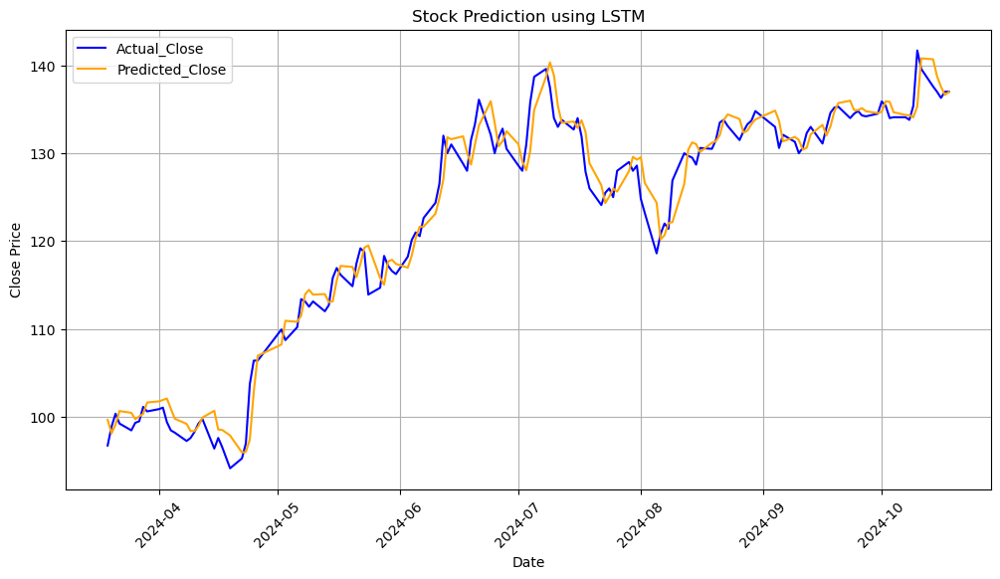

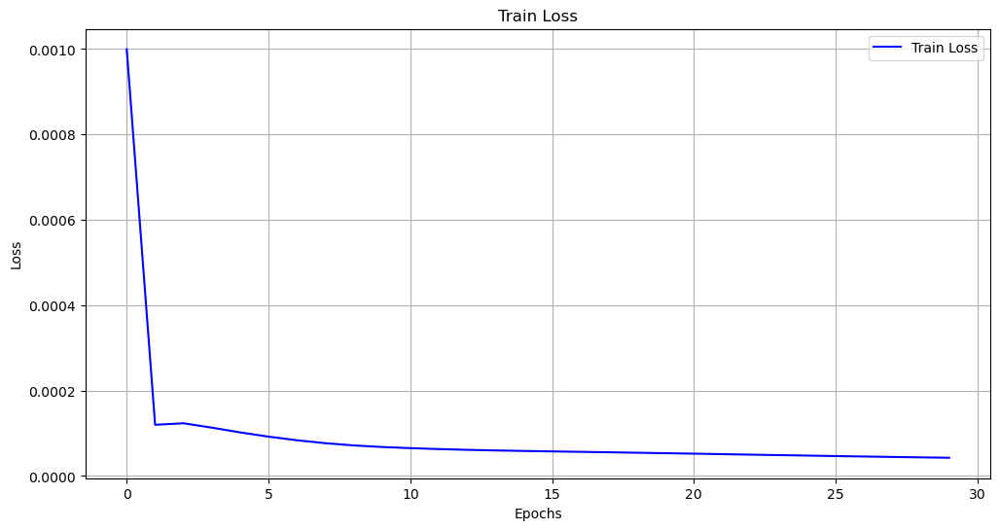

,Date,Actual_Close,Predicted_Close
0,2024-03-19,96.7232,99.643745
1,2024-03-20,98.8822,98.110558
2,2024-03-21,100.3503,99.104416
3,2024-03-22,99.2276,100.652946
4,2024-03-25,98.4504,100.447037
...,...,...,...
143,2024-10-14,137.6000,140.698151
144,2024-10-15,137.0000,138.764328
145,2024-10-16,136.3000,137.572647
146,2024-10-17,137.0000,136.646088


In [61]:
lstm_prediction(full_fpt_data)

Epoch 1/30


C:\Users\ACER\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


56/56 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0367
Epoch 2/30
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0022
Epoch 3/30
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0020
Epoch 4/30
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0018
Epoch 5/30
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0017
Epoch 6/30
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0016
Epoch 7/30
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0014
Epoch 8/30
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0014
Epoch 9/30
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0013
Epoch 10/30
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0012
Epoch 11/30
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0011
Epoch 12/30
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0011
Epoch 13/30
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0011
Epoch 14/30
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0010
Epoch 15/30
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0010
Epoch 16/30
56/

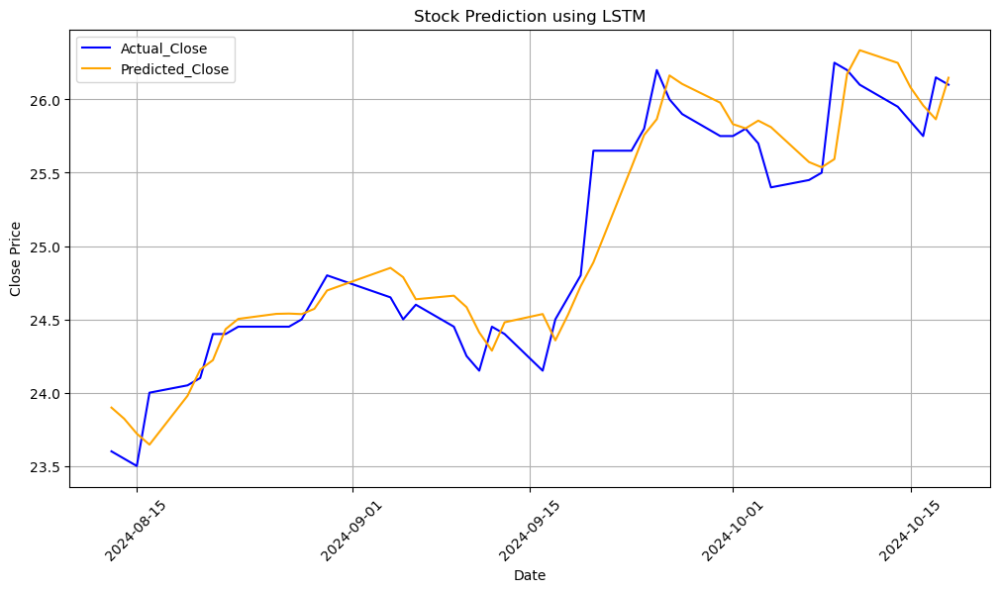

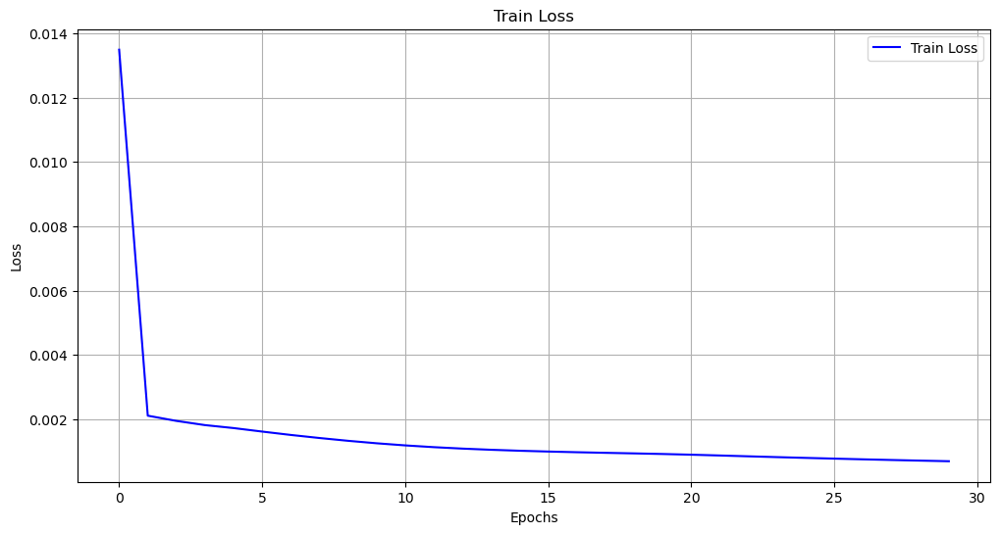

,Date,Actual_Close,Predicted_Close
0,2024-08-13,23.60,23.898411
1,2024-08-14,23.55,23.822826
2,2024-08-15,23.50,23.720629
3,2024-08-16,24.00,23.645767
4,2024-08-19,24.05,23.978737
5,2024-08-20,24.10,24.157194
6,2024-08-21,24.40,24.221788
7,2024-08-22,24.40,24.433268
8,2024-08-23,24.45,24.503172
9,2024-08-26,24.45,24.537533


In [62]:
lstm_prediction(full_acb_data)

Epoch 1/30


C:\Users\ACER\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


176/176 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - loss: 0.0136
Epoch 2/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 4.5789e-04
Epoch 3/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 3.8763e-04
Epoch 4/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 3.4062e-04
Epoch 5/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 3.0071e-04
Epoch 6/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 2.7054e-04
Epoch 7/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 2.4913e-04
Epoch 8/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 2.3392e-04
Epoch 9/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 2.2237e-04
Epoch 10/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 2.1286e-04
Epoch 11/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 2.0484e-04
Epoch 12/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 1.9817e-04
Epoch 13/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 1.9269e-04
Epoch 14/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 1.8822e-04
Ep

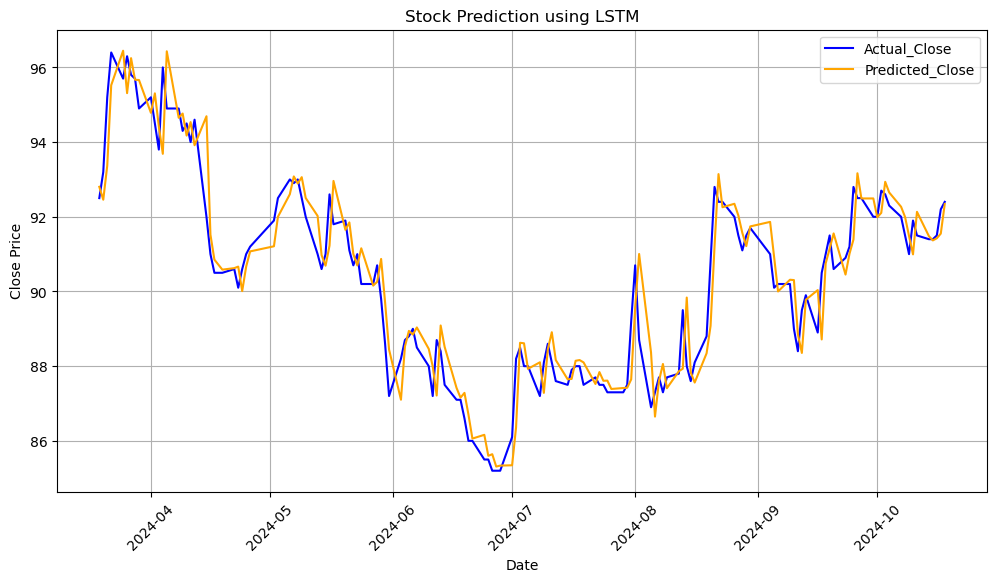

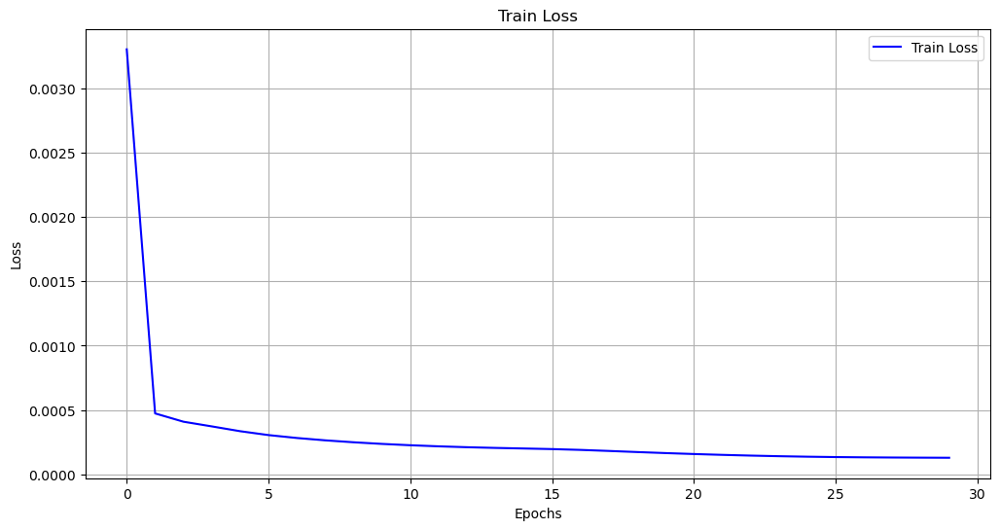

,Date,Actual_Close,Predicted_Close
0,2024-03-19,92.5,92.802864
1,2024-03-20,93.2,92.457100
2,2024-03-21,95.2,93.366142
3,2024-03-22,96.4,95.522774
4,2024-03-25,95.7,96.447044
...,...,...,...
143,2024-10-14,91.4,91.482552
144,2024-10-15,91.4,91.367516
145,2024-10-16,91.5,91.425034
146,2024-10-17,92.2,91.549294


In [63]:
lstm_prediction(full_vcb_data)

Mô hình dự đoán giá cổ phiếu bằng LSTM được xây dựng bắt đầu từ việc chuẩn bị dữ liệu. Đầu tiên, chỉ các cột Date và Close được chọn từ DataFrame ban đầu, sau đó cột Date được chuyển đổi thành định dạng datetime và thiết lập làm chỉ mục. Dữ liệu giá cổ phiếu (Close) được chuẩn hóa về phạm vi từ 0 đến 1 bằng cách sử dụng MinMaxScaler, giúp mô hình học hiệu quả hơn.

Tiếp theo, dữ liệu được chia thành các cửa sổ có kích thước cố định (default là 30) để tạo ra các chuỗi giá trị cho mô hình LSTM học. Mỗi cửa sổ đại diện cho chuỗi dữ liệu giá cổ phiếu trong một khoảng thời gian nhất định. Dữ liệu được chia thành 95% cho tập huấn luyện và 5% cho tập kiểm tra. Mô hình LSTM được xây dựng với ba lớp chính: LSTM đầu tiên với 150 đơn vị, LSTM thứ hai với 100 đơn vị, và một lớp Dense với 50 đơn vị. Mỗi lớp LSTM được trang bị một lớp Dropout để giảm overfitting.

Sau khi mô hình được xây dựng, nó được huấn luyện trong một số epoch (default là 25), sử dụng batch size là 16 và optimizer Adam với learning rate 0.005. Sau khi huấn luyện, mô hình dự đoán giá cổ phiếu trong tập kiểm tra và kết quả dự đoán được đảo ngược chuẩn hóa để đưa về giá trị ban đầu. Một DataFrame được tạo ra để so sánh giá thực tế và giá dự đoán, từ đó tính toán các chỉ số đánh giá như MSE, RMSE và MAE.

Cuối cùng, các kết quả được trực quan hóa để đánh giá hiệu quả của mô hình. Biểu đồ so sánh giữa giá thực tế và giá dự đoán giúp người dùng dễ dàng nhận thấy độ chính xác của mô hình, trong khi biểu đồ loss cho thấy sự thay đổi trong quá trình huấn luyện. Những bước này giúp xây dựng một mô hình LSTM hiệu quả để dự đoán giá cổ phiếu và đánh giá chất lượng dự đoán của mô hình.